### This analysis is done for validating the results from supervised analysis

The latent space of tiles is taken from the 3-class classifier's last layer and fed into unsupervised algorithms such as UMAP and tSNE. 
The two first components are plotted first with treatment group label (Control, ECMO, ECMO+LPS, MV, MV+LPS),
second with predicted 3 class label as low, medium and high.
Third with gold labels as low, medium, and high and compared.

In [ ]:

import pandas as pd
df_scores = pd.read_excel(r'../../../Three_class_files/data/raw_data/ROW_DATA_Sonja_add_MV_ECMO_and_ECMO_LPS.xlsx',sheet_name='Total Score',engine='openpyxl')
df_scores_Ct_MV_LP = df_scores[0:19]

df_scores

### Model Definition and data points

In [ ]:
#!/usr/bin/env python
# coding: utf-8
from sklearn.manifold import TSNE
import sklearn as sm
from __future__ import print_function
import time
import numpy as np
from sklearn.decomposition import PCA
import os
import matplotlib.pyplot as plt
from PIL import Image
import cv2
import glob
import sys
import glob
import numpy as np
import cv2
import tensorflow as tf
from path import Path
from keras.applications.vgg16 import VGG16
from keras.preprocessing import image
from keras.applications.vgg16 import preprocess_input
from keras.layers import Input, Flatten, Dense, Lambda, BatchNormalization, Dropout
from keras.models import Model
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import glob
import cv2
from pathlib import Path
from tensorflow.keras.utils import plot_model
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from keras.models import model_from_json
#from plot import multi_plot
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score
from matplotlib import pyplot
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import f1_score
from sklearn.metrics import auc
import keras
import tensorflow as tf
from keras.callbacks import ModelCheckpoint
import pandas as pd
import numpy as np
from tensorflow.keras import backend as K
from tensorflow.python.keras.layers import InputSpec, Layer
import os
import tkinter
import matplotlib
import matplotlib.pyplot as plt
#%matplotlib inline

from tensorflow.keras.optimizers import RMSprop
from tensorflow.keras.applications import EfficientNetB0,EfficientNetB4,EfficientNetB7
import os
##https://neptune.ai/blog/keras-metrics
from keras.callbacks import Callback
import matplotlib.pyplot as plt
import numpy as np
from scikitplot.metrics import plot_confusion_matrix, plot_roc, plot_precision_recall, plot_precision_recall_curve
import re
#################################################################
#import numpy as np
from sklearn.manifold import TSNE
#from umap import UMAP
import umap.umap_ as umap
reducer = umap.UMAP()

from sklearn.decomposition import PCA

###############################################################
################################################################################
# Model definition for classification
# Calculate True positives
class MulticlassTruePositives(tf.keras.metrics.Metric):
    def __init__(self, name='multiclass_true_positives', **kwargs):
        super(MulticlassTruePositives, self).__init__(name=name, **kwargs)
        self.true_positives = self.add_weight(name='tp', initializer='zeros')

    def update_state(self, y_true, y_pred, sample_weight=None):
        y_pred = tf.reshape(tf.argmax(y_pred, axis=1), shape=(-1, 1))
        values = tf.cast(y_true, 'int32') == tf.cast(y_pred, 'int32')
        values = tf.cast(values, 'float32')
        if sample_weight is not None:
            sample_weight = tf.cast(sample_weight, 'float32')
            values = tf.multiply(values, sample_weight)
        self.true_positives.assign_add(tf.reduce_sum(values))

    def result(self):
        return self.true_positives

    def reset_state(self):
        # The state of the metric will be reset at the start of each epoch.
        self.true_positives.assign(0.)

## Model definition
#################################################################################################################################
########################################################################
### EfficinetnetB4 model with only fine-tuning of top layers 
def pretrained_model_func(img_shape, num_classes,layer_type):
    model_effnetB4_conv = VGG16(weights='imagenet', include_top=False)

    #Input format
    keras_input = Input(shape=(224,224,3), name = 'image_input')
    
    #Use the generated model 
    output_effnetB4_conv = model_effnetB4_conv(keras_input)
    
    for layer in model_effnetB4_conv.layers:
        layer.trainable = False
    
    #Add the fully-connected layers 
    x = Flatten(name='flatten')(output_effnetB4_conv)
    x = Dense(128, activation=layer_type, name='fc1')(x)
    x = Dense(128, activation=layer_type, name='fc2')(x)
    x = Dropout(0.5, name='dropout')(x)
    x = Dense(num_classes, activation='softmax', name='predictions')(x)
    
    METRICS = [
      keras.metrics.SparseCategoricalAccuracy(),   # this is the metric for multi class accuracy NOT in form of one-hot vector
      MulticlassTruePositives()]
    
    
    #Create your own model 
    pretrained_model = Model(inputs=keras_input, outputs=x) ## This is the model from input to last decision layer
    pretrained_model.compile(loss='sparse_categorical_crossentropy', optimizer='adam', metrics=METRICS)
    
    return pretrained_model


#######################################################################
######################################################################
######################################################################
validation_slide = ['1st_part','2nd_part','3rd_part']
model_name       = 'Vgg16_rnd_aug'
### I took the best models in terms of accuracy 

total_img_name =[]
color_map = {'ECMO':'#2ca02c','ECMO+LPS':'#d62728','MV+LPS':'#9467bd','MV':'#8c564b','Control':'#1f77b4'}
###########################
image_color = []
np_vector_data = []   ### Latent space from last fully connected layer
###########################
for val_s in validation_slide:
    val_dir          = val_s # loop over all groups as validation dataset
    Sample_Slide     = {'Control' : [9, 14, 15, 16, 17, 18, 19, 20, 26, 28, 46, 47],  
                    'MV+LPS'  : [35, 36, 41, 42, 43, 44, 45],
                    'ECMO+LPS': [1, 2 ,4, 5, 6, 7, 8, 25, 37, 38, 48],
                    'MV'      : [3, 10, 13, 28, 34],
                    'ECMO'    : [11, 12, 29, 30, 31, 32, 33, 39, 40, 49]}


    validation_DATA_PATH  = '../../data/folded_data/3fold_CV/validation/'+val_dir+'_validation/'
    validation_LABEL_PATH = '../../data/folded_data/3fold_CV/All_samples_total_score_Median/'+val_dir+'_val_total_score/validation/validation_newlabels.txt'

    ### Max and min of Median column 
    max_score = max(df_scores['Median'])
    min_score = min(df_scores['Median'])

    ##Normalized thresholds
    low = (10-(min_score))/(max_score-min_score)
    mid = (25-(min_score))/(max_score-min_score)
    
    ## Initialize validation samples
    input_shape = (224,224,3)
    validation_images = glob.glob(validation_DATA_PATH+'*.tif')
    n_v= len(validation_images) 
    validation_samples = np.zeros((n_v, input_shape[0], input_shape[1], 3), dtype=np.float32)
    validation_label = np.zeros((n_v,), int)

    
    
    
    # Reading true labels of validation set
    precise_scores = []
    image_names = []
    with open(validation_LABEL_PATH,'r') as f:
        for ctr,line in zip(range(n_v),f):
            validation_samples[ctr,:,:,:] = cv2.imread(validation_DATA_PATH+(line.split()[0]))
            la = float(line.split()[1])
            
            if la > mid:
                validation_label[ctr] = 2
            elif la > low:
                validation_label[ctr] = 1
            else:
                validation_label[ctr] = 0
            precise_scores.append(validation_label[ctr])
            image_names.append(line.split(' ')[0 ])  
        total_img_name += image_names
    


### Adding Probe to the last FC2 layer and save Feature vectors

In [ ]:
#!/usr/bin/env python
# coding: utf-8

from __future__ import print_function
import time
import numpy as np
#import pandas as pd
#from sklearn.datasets import fetch_mldata
from sklearn.decomposition import PCA
#from sklearn.manifold import TSNE
#import matplotlib.pyplot as plt
#from mpl_toolkits.mplot3d import Axes3D
#import seaborn as sns
import os
import matplotlib.pyplot as plt
from PIL import Image
#import numpy as np
import cv2
import glob
#from scipy.misc import bytescale
#import pandas as pd

import sys
#sys.path.append('/cephyr/users/salmak/Alvis/.conda/envs/SalmaEnv/lib/python3.9/site-packages')
import glob
import numpy as np
import cv2
import tensorflow as tf
from path import Path
from keras.applications.vgg16 import VGG16
from keras.preprocessing import image
from keras.applications.vgg16 import preprocess_input
from keras.layers import Input, Flatten, Dense, Lambda, BatchNormalization, Dropout
from keras.models import Model
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import glob
import cv2
from pathlib import Path
from tensorflow.keras.utils import plot_model
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from keras.models import model_from_json
#from plot import multi_plot
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score
from matplotlib import pyplot
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import f1_score
from sklearn.metrics import auc
import keras
import tensorflow as tf
from keras.callbacks import ModelCheckpoint
import pandas as pd
import numpy as np
from tensorflow.keras import backend as K
from tensorflow.python.keras.layers import InputSpec, Layer
import os
import tkinter
import matplotlib
import matplotlib.pyplot as plt
#%matplotlib inline

from tensorflow.keras.optimizers import RMSprop
from tensorflow.keras.applications import EfficientNetB0,EfficientNetB4,EfficientNetB7
import os
##https://neptune.ai/blog/keras-metrics
from keras.callbacks import Callback
import matplotlib.pyplot as plt
import numpy as np
from scikitplot.metrics import plot_confusion_matrix, plot_roc, plot_precision_recall, plot_precision_recall_curve
import re
#################################################################
#import numpy as np
from sklearn.manifold import TSNE
#from umap import UMAP
import umap.umap_ as umap
reducer = umap.UMAP()

from sklearn.decomposition import PCA

###############################################################
################################################################################
# Model definition for classification
# Calculate True positives
class MulticlassTruePositives(tf.keras.metrics.Metric):
    def __init__(self, name='multiclass_true_positives', **kwargs):
        super(MulticlassTruePositives, self).__init__(name=name, **kwargs)
        self.true_positives = self.add_weight(name='tp', initializer='zeros')

    def update_state(self, y_true, y_pred, sample_weight=None):
        y_pred = tf.reshape(tf.argmax(y_pred, axis=1), shape=(-1, 1))
        values = tf.cast(y_true, 'int32') == tf.cast(y_pred, 'int32')
        values = tf.cast(values, 'float32')
        if sample_weight is not None:
            sample_weight = tf.cast(sample_weight, 'float32')
            values = tf.multiply(values, sample_weight)
        self.true_positives.assign_add(tf.reduce_sum(values))

    def result(self):
        return self.true_positives

    def reset_state(self):
        # The state of the metric will be reset at the start of each epoch.
        self.true_positives.assign(0.)

## Model definition
#################################################################################################################################
########################################################################
### EfficinetnetB4 model with only fine-tuning of top layers 
def pretrained_model_func(img_shape, num_classes,layer_type):
    model_vgg_conv = VGG16(weights='imagenet', include_top=False)

    #Input format
    keras_input = Input(shape=(224,224,3), name = 'image_input')
    
    #Use the generated model 
    output_vgg_conv = model_vgg_conv(keras_input)
    
    for layer in model_vgg_conv.layers:
        layer.trainable = False
    
    #Add the fully-connected layers 
    x = Flatten(name='flatten')(output_vgg_conv)
    x = Dense(128, activation=layer_type, name='fc1')(x)
    x = Dense(128, activation=layer_type, name='fc2')(x)
    x = Dropout(0.5, name='dropout')(x)
    x = Dense(num_classes, activation='softmax', name='predictions')(x)
    
    METRICS = [
      keras.metrics.SparseCategoricalAccuracy(),   # this is the metric for multi class accuracy NOT in form of one-hot vector
      MulticlassTruePositives()]
    
    
    #Create your own model 
    pretrained_model = Model(inputs=keras_input, outputs=x) ## This is the model from input to last decision layer
    pretrained_model.compile(loss='sparse_categorical_crossentropy', optimizer='adam', metrics=METRICS)
    
    return pretrained_model


#######################################################################
######################################################################
######################################################################
validation_slide = ['1st_part','2nd_part','3rd_part']
model_name       = 'Vgg16_rnd_aug'
### I took the best models in terms of accuracy 

total_img_name =[]
color_map = {'ECMO':'#2ca02c','ECMO+LPS':'#d62728','MV+LPS':'#9467bd','MV':'#8c564b','Control':'#1f77b4'}
###########################
image_color = []
np_vector_data_drop = []   ### Latent space from last fully connected layer
###########################
for val_s in validation_slide:
    val_dir          = val_s # loop over all groups as validation dataset
    Sample_Slide     = {'Control' : [9, 14, 15, 16, 17, 18, 19, 20, 26, 28, 46, 47],  
                    'MV+LPS'  : [35, 36, 41, 42, 43, 44, 45],
                    'ECMO+LPS': [1, 2 ,4, 5, 6, 7, 8, 25, 37, 38, 48],
                    'MV'      : [3, 10, 13, 28, 34],
                    'ECMO'    : [11, 12, 29, 30, 31, 32, 33, 39, 40, 49]}


    validation_DATA_PATH  = '../../data/folded_data/3fold_CV/validation/'+val_dir+'_validation/'
    validation_LABEL_PATH = '../../data/folded_data/3fold_CV/All_samples_total_score_Median/'+val_dir+'_val_total_score/validation/validation_newlabels.txt'

   
    ### Max and min of Median column 
    max_score = max(df_scores['Median'])
    min_score = min(df_scores['Median'])

    ##Normalized thresholds
    low = (10-(min_score))/(max_score-min_score)
    mid = (25-(min_score))/(max_score-min_score)
    
    ## Initialize validation samples
    input_shape = (224,224,3)
    validation_images = glob.glob(validation_DATA_PATH+'*.tif')
    n_v= len(validation_images) 
    validation_samples = np.zeros((n_v, input_shape[0], input_shape[1], 3), dtype=np.float32)
    validation_label = np.zeros((n_v,), int)

    
    
    
    # Reading true labels of validation set
    precise_scores = []
    image_names = []
    with open(validation_LABEL_PATH,'r') as f:
        for ctr,line in zip(range(n_v),f):
            validation_samples[ctr,:,:,:] = cv2.imread(validation_DATA_PATH+(line.split()[0]))
            la = float(line.split()[1])
            
            if la > mid:
                validation_label[ctr] = 2
            elif la > low:
                validation_label[ctr] = 1
            else:
                validation_label[ctr] = 0
            precise_scores.append(validation_label[ctr])
            image_names.append(line.split(' ')[0 ])  
        total_img_name += image_names
    

    
    ####Assign a color to each data point ####################################

    for i_n in image_names:
        slide_num = i_n[0:8]
        v = int(re.findall(r'\d+', str(slide_num))[0])
        for k in Sample_Slide.keys():
            if v in Sample_Slide[k]:
                if v!=28:
                    image_color = image_color+[color_map[k]]
                    break
                elif v ==28:
                    if slide_num[0]=='s':
                        image_color = image_color+ [color_map['Control']]
                        break
                    elif slide_num[0]=='S':
                        image_color = image_color+[color_map['MV']]
                        break
                    
        
    ################################################################################  
    #####Basically what I did here is saving the latent space of each tile as only a vector of size 128
    #### after fc2 layer of my classifier

    for i in range(n_v):
        mod_img = validation_samples[i,:, :].astype(np.float32)
        validation_samples[i, :, :, :] = mod_img
    pretrained_model = pretrained_model_func(input_shape, 3,'relu') ## REGRESSION: number of classes 1 instead of 3
    weights =glob.glob('../../models/initial_relu/3fold_CV/vgg_aug_3fold/'+val_dir+'*.hdf5')
    print(weights)
    # Load weights, select between best_weights (val_accuracy) and final_weights from last epoch
    pretrained_model.load_weights(weights[0])

    with tf.device('/CPU:0'):
        mid_model = Model(inputs=pretrained_model.input, outputs=pretrained_model.get_layer('fc2').output)## Here I took output from flatten layer
        mid_out  = mid_model.predict(validation_samples)
        print(mid_out.shape)

        if not len(np_vector_data_drop): 
            np_vector_data_drop = mid_out
        else:
            np_vector_data_drop = np.append(np_vector_data_drop,mid_out,axis = 0)

        ## Now we have all tiles' latent space vectors from model as saved in np_vector_data 
#######################################################################



### Save and load feature vectors

In [ ]:

np.save('20251125_vgg_rnd_aug_latent_space_sk', np_vector_data, allow_pickle=True, fix_imports=True)
np.save('20251126_vgg_rnd_aug_latent_space_sk_flatten', np_vector_data_drop, allow_pickle=True, fix_imports=True)
np.save('20251125_vgg_rnd_img_color_5groups_sk', image_color, allow_pickle=True, fix_imports=True)

In [ ]:

np_vector_data = np.load('20251125_vgg_rnd_aug_latent_space_sk.npy')
print(np_vector_data.shape)

image_color = np.load('20251125_vgg_rnd_img_color_5groups_sk.npy')
print(image_color.shape)

np_vector_data_drop = np.load('20231122_vgg_rnd_aug_latent_space_sk_flatten.npy')
print(np_vector_data_drop.shape)


(8073, 128)


### The next cell is for saving the color of tiles with 3 class labels (low, medium, high) with both predicted and gold scores 

In [48]:
import glob
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

from sklearn.metrics import precision_score, recall_score, f1_score,multilabel_confusion_matrix
from sklearn.metrics import precision_recall_curve
#from sklearn.metrics import plot_precision_recall_curve
from sklearn.metrics import classification_report, confusion_matrix
%matplotlib inline
from scikitplot.metrics import plot_confusion_matrix, plot_roc, plot_precision_recall, plot_precision_recall_curve
G_s = []
P_s = []
model_name = 'Vgg16_rnd_aug'

total_img_name =[]
color_map = {'ECMO':'#2ca02c','ECMO+LPS':'#d62728','MV+LPS':'#9467bd','MV':'#8c564b','Control':'#1f77b4'}
class_color_map = {0:'yellow',1:'orange',2:'red'}
diff_map = {True:'none',False:'black'}
validation_slide = ['1st_part','2nd_part','3rd_part']
for val_dir in validation_slide:
    
    validation_DATA_PATH  = '../../../Three_class_files/data/folded_data/3fold_CV/validation/'+val_dir+'_validation/'
    validation_LABEL_PATH = '../../../Three_class_files/data/folded_data/3fold_CV/All_samples_total_score_Median/'+val_dir+'_val_total_score/validation/validation_newlabels.txt'

   
  
    ### Max and min of Median column 
    max_score = max(df_scores['Median'])
    min_score = min(df_scores['Median'])

    ##Normalized thresholds
    low = (10-(min_score))/(max_score-min_score)
    mid = (25-(min_score))/(max_score-min_score)
    
    ## Initialize validation samples
    input_shape = (224,224,3)
    validation_images = glob.glob(validation_DATA_PATH+'*.tif')
    n_v= len(validation_images) 
    validation_label = np.zeros((n_v,), int)
    
    ######################################################################################################
    precise_scores = []
    image_names = []
    with open(validation_LABEL_PATH,'r') as f:
        for ctr,line in zip(range(n_v),f):
            #validation_samples[ctr,:,:,:] = cv2.imread(validation_DATA_PATH+(line.split()[0]))
            la = float(line.split()[1])
            
            if la > mid:
                validation_label[ctr] = 2
            elif la > low:
                validation_label[ctr] = 1
            else:
                validation_label[ctr] = 0
            precise_scores.append(validation_label[ctr])
            image_names.append(line.split(' ')[0 ])  
        total_img_name += image_names
############################################################################################################    
    y_pred = []  
    with open('../../../Three_class_files/results/classification/predict_result_3cv/'+model_name+'_'+val_dir+'_validation_predicted_newlabels.txt','r') as f:
        for line in f:
            y_pred.append(int(line.split(' ')[1].strip()))  
        P_s += y_pred
        G_s +=precise_scores
Color_P_s = [class_color_map[i] for i in P_s]
Color_G_s = [class_color_map[i] for i in G_s]
diff_s = [i==j for i,j in zip(P_s,G_s)]
Color_diff = [diff_map[i] for i in diff_s]
print(len(Color_P_s))
print(len(Color_G_s))
print(len(Color_diff))

8073
8073
8073


I just wanted to check the bias of each folds' latent space. And as I could guess they were different and 
that variation could make separate clusters while it was not what I really wanted

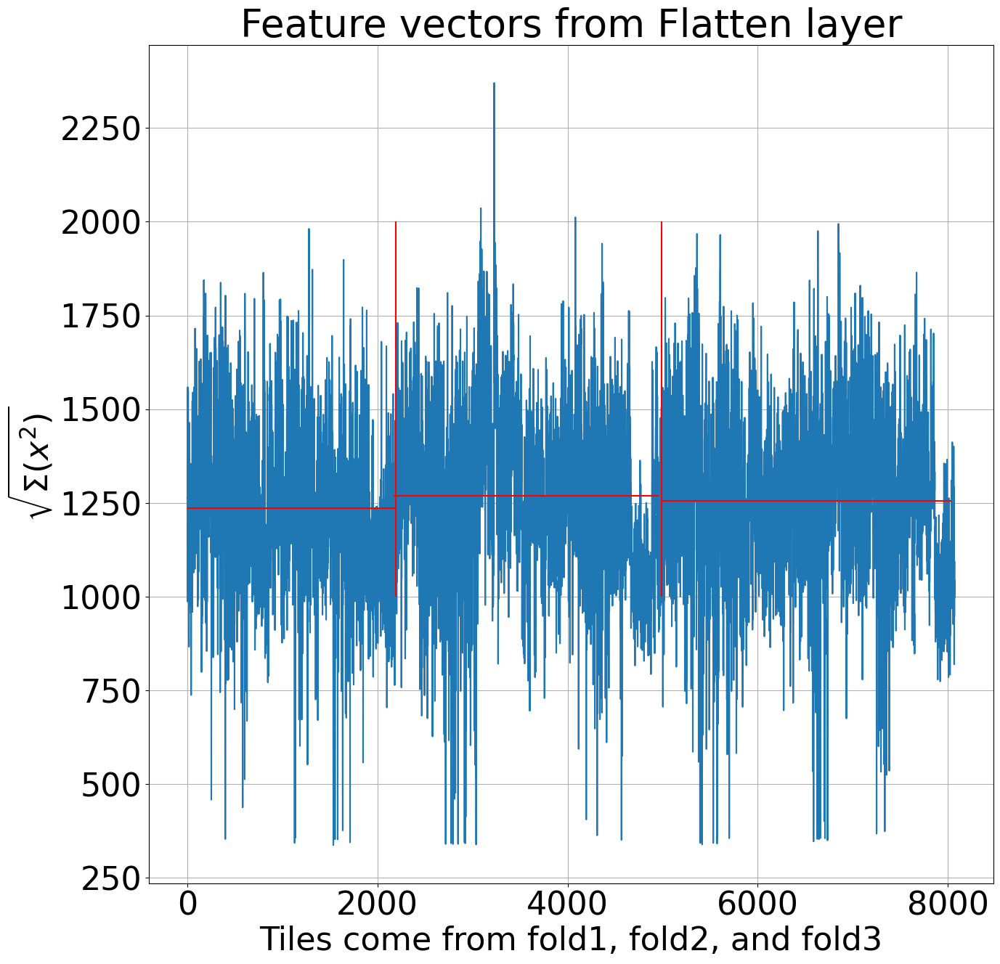

In [ ]:
#### Just plot the norm of vectors
#### These are vectors after flatten layer with 25088 vector size

new_data =   [np.linalg.norm(i) for i in np_vector_data_drop]



plt.figure(figsize=(15,15))
plt.plot(new_data)

plt.vlines(2196,1000,2000,colors='red')
plt.vlines(2196+2789,1000,2000,colors='red')

plt.hlines(np.mean(new_data[0:2196]),0,2196,colors='red')
plt.hlines(np.mean(new_data[2196:2196+2789]),2169,(2169+2789),colors='red')
plt.hlines(np.mean(new_data[2196+2789:]),2196+2789,8037,colors='red')
plt.title('Feature vectors from Flatten layer')
plt.ylabel(r'$\sqrt{\Sigma(x^2)}$')
#plt.ylabel('Norm of() latent space vectors',fontsize=32)
plt.xlabel('Tiles come from fold1, fold2, and fold3',fontsize=32)
plt.grid()


#plt.xlim([-100,8200])
#plt.ylim([-500, 1200])
plt.rcParams.update({'font.size': 32})

#new_data

### Norm of feature vectors from fc2 layer

In [ ]:
#### Just plot the norm of vectors
#### These are feature vectors after fc2 layer with 128 vector size
new_data =   [np.linalg.norm(i) for i in np_vector_data]

print(new_data)

plt.figure(figsize=(15,15))
plt.plot(new_data)

plt.vlines(2196,0,200,colors='red')
plt.vlines(2196+2789,0,200,colors='red')

plt.hlines(np.mean(new_data[0:2196]),0,2196,colors='red')
plt.hlines(np.mean(new_data[2196:2196+2789]),2169,(2169+2789),colors='red')
plt.hlines(np.mean(new_data[2196+2789:]),2196+2789,8037,colors='red')
plt.title('Feature vectors from FC2 layer')
plt.ylabel(r'$\sqrt{\Sigma(x^2)}$')
#plt.ylabel('Norm of() latent space vectors',fontsize=32)
plt.xlabel('Tiles come from fold1, fold2, and fold3',fontsize=32)
plt.grid()

#plt.xlim([-100,8200])
#plt.ylim([-500, 1200])
plt.rcParams.update({'font.size': 32})

#new_data

### Fearure vectors from fc2 layer

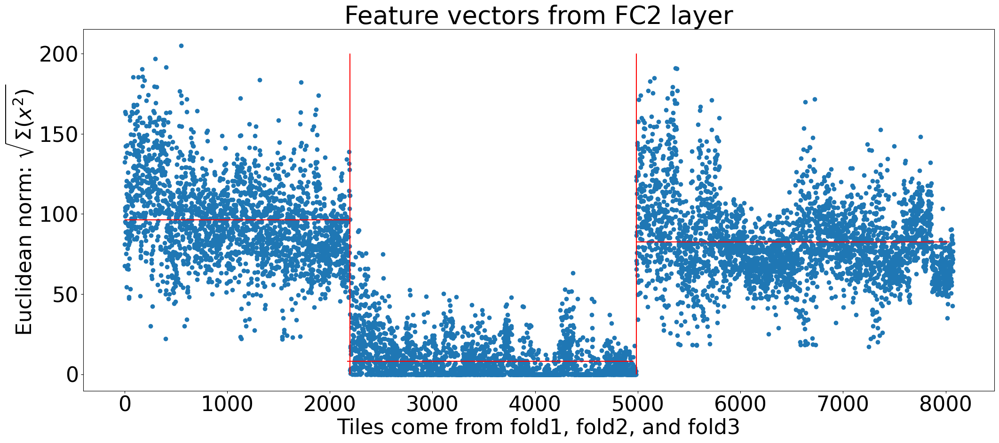

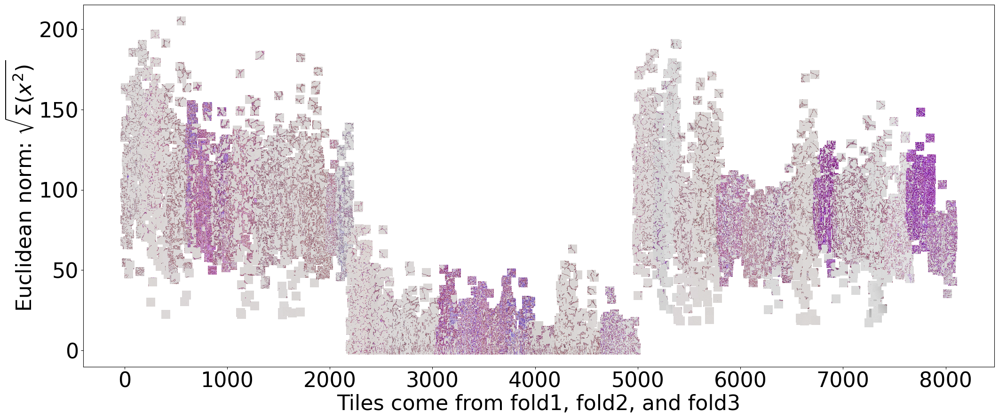

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
from matplotlib.cbook import get_sample_data
import glob
#markers = [plt.Line2D([0,0],[0,0],color=color, marker='.', linestyle='') for color in class_color_map.values()]
def main():
    
    x = np.arange(8073) #error_slides+x_circle[0]
    y = [np.linalg.norm(i) for i in np_vector_data]  



    fig, ax = plt.subplots(figsize=(25,10))
    plt.scatter(x,y)
    plt.vlines(2196,0,200,colors='red')
    plt.vlines(2196+2789,0,200,colors='red')

    plt.hlines(np.mean(new_data[0:2196]),0,2196,colors='red')
    plt.hlines(np.mean(new_data[2196:2196+2789]),2169,(2169+2789),colors='red')
    plt.hlines(np.mean(new_data[2196+2789:]),2196+2789,8037,colors='red')
    ax.set_title('Feature vectors from FC2 layer')
    ax.set_ylabel(r'Euclidean norm: $\sqrt{\Sigma(x^2)}$')
    #plt.ylabel('Norm of() latent space vectors',fontsize=32)
    ax.set_xlabel('Tiles come from fold1, fold2, and fold3',fontsize=32)
    paths = total_img_name
    
    fig, ax = plt.subplots(figsize=(25,10))
    
    ax.set_ylabel(r'Euclidean norm: $\sqrt{\Sigma(x^2)}$',fontsize=32)
    ax.set_xlabel('Tiles come from fold1, fold2, and fold3',fontsize=32)
    
    ax.set_xlim([-100,8200])
    ax.set_ylim([-600, 1200])
    
    imscatter(x, y, paths, zoom=0.06, ax=ax)
    ###############################################################
    plt.rcParams.update({'font.size': 32})
    plt.show()

def imscatter(x, y, paths, ax=None, zoom=.5):
    if ax is None:
        ax = plt.gca()
    x, y = np.atleast_1d(x, y)
    artists = []
    for x0, y0,p in zip(x, y,paths):
        
        im = OffsetImage(cv2.imread('../../data/All_images/'+p), zoom=zoom)
        ab = AnnotationBbox(im, (x0, y0), xycoords='data', frameon=False)
        artists.append(ax.add_artist(ab))
    ax.update_datalim(np.column_stack([x, y]))
    ax.autoscale()
    return artists

main()

### Feature vectors from flatten layer

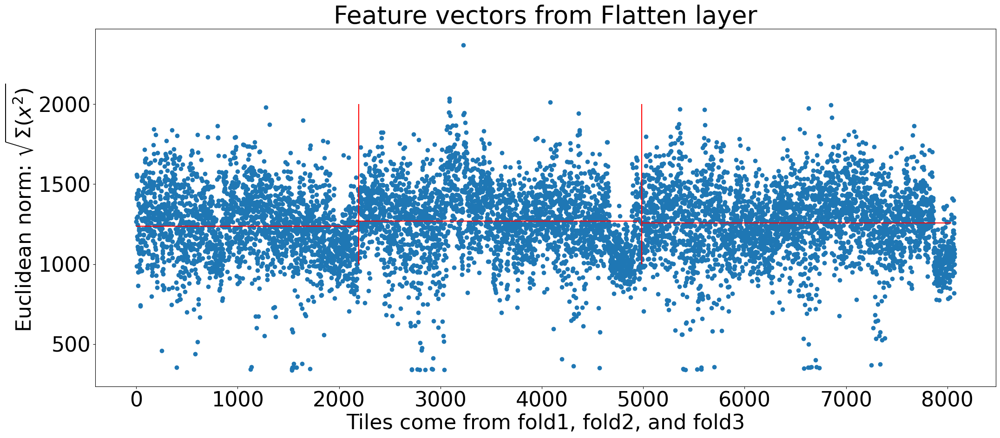

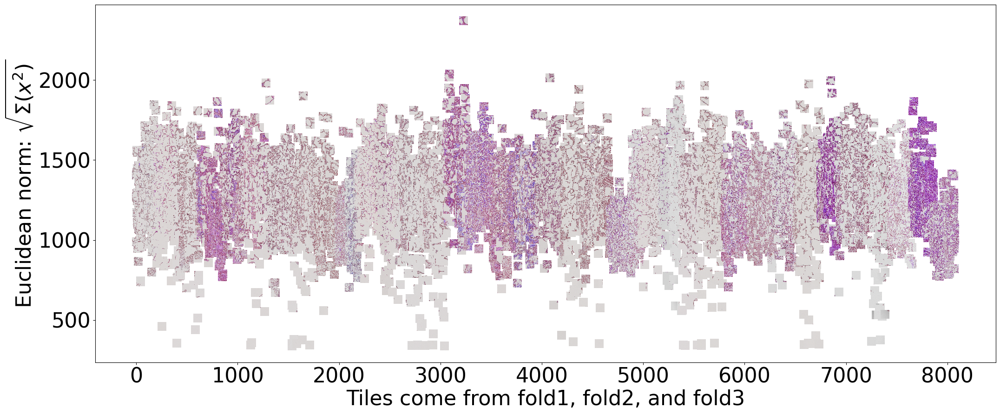

In [48]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
from matplotlib.cbook import get_sample_data
import glob
#markers = [plt.Line2D([0,0],[0,0],color=color, marker='.', linestyle='') for color in class_color_map.values()]
def main():
    #x = np.linspace(0, 10, 20)
    #ax1.scatter(X_UMAP[2196+2789:,0], X_UMAP[2196+2789:,1], c=g_class_clr[2196+2789:], marker='.')
    x = np.arange(8073) #error_slides+x_circle[0]
    new_data = [np.linalg.norm(i) for i in np_vector_data_drop]  
    y = new_data


    fig, ax = plt.subplots(figsize=(25,10))
    plt.scatter(x,y)
    plt.vlines(2196,1000,2000,colors='red')
    plt.vlines(2196+2789,1000,2000,colors='red')

    plt.hlines(np.mean(new_data[0:2196]),0,2196,colors='red')
    plt.hlines(np.mean(new_data[2196:2196+2789]),2169,(2169+2789),colors='red')
    plt.hlines(np.mean(new_data[2196+2789:]),2196+2789,8037,colors='red')
    ax.set_title('Feature vectors from Flatten layer')
    ax.set_ylabel(r'Euclidean norm: $\sqrt{\Sigma(x^2)}$')
    #plt.ylabel('Norm of() latent space vectors',fontsize=32)
    ax.set_xlabel('Tiles come from fold1, fold2, and fold3',fontsize=32)
    paths = total_img_name
    
    fig, ax = plt.subplots(figsize=(25,10))
    
    ax.set_ylabel(r'Euclidean norm: $\sqrt{\Sigma(x^2)}$',fontsize=32)
    ax.set_xlabel('Tiles come from fold1, fold2, and fold3',fontsize=32)
    
    ax.set_xlim([-100,8200])
    ax.set_ylim([-600, 1200])
    
    imscatter(x, y, paths, zoom=0.06, ax=ax)
    ###############################################################
    plt.rcParams.update({'font.size': 32})
    plt.show()

def imscatter(x, y, paths, ax=None, zoom=.5):
    if ax is None:
        ax = plt.gca()
    x, y = np.atleast_1d(x, y)
    artists = []
    for x0, y0,p in zip(x, y,paths):
        
        im = OffsetImage(cv2.imread('../../data/All_images/'+p), zoom=zoom)
        ab = AnnotationBbox(im, (x0, y0), xycoords='data', frameon=False)
        artists.append(ax.add_artist(ab))
    ax.update_datalim(np.column_stack([x, y]))
    ax.autoscale()
    return artists

main()

### Unactivated tiles counts

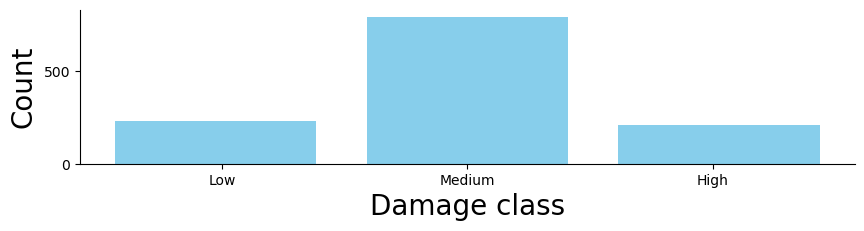

In [78]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
from matplotlib.cbook import get_sample_data
import glob
#markers = [plt.Line2D([0,0],[0,0],color=color, marker='.', linestyle='') for color in class_color_map.values()]
def main():
    #x = np.linspace(0, 10, 20)
    #ax1.scatter(X_UMAP[2196+2789:,0], X_UMAP[2196+2789:,1], c=g_class_clr[2196+2789:], marker='.')
    x = error_slides
    y = np.array(score_)
   
    
    y[y > 25] = 40
    y[(y>= 10) & (y<= 25)] = 30
    y[y<10] = 20
    y = (y-20)/10
    
  

    
    fig, ax = plt.subplots(figsize=(10,2))
    
    ax.set_xlabel('Damage class',fontsize=20)
    ax.set_ylabel('Count',fontsize=20)
    plt.tick_params(axis='both', which='minor', labelsize=10)
    plt.tick_params(axis='y', which='minor', labelsize=5)
    plt.hist(
    y,
    bins=3,        # number of bins
    color='skyblue',# bar color
    rwidth=0.8,      # relative width (0–1)
)
    plt.xticks(ticks=[0.35, 1, 1.65], labels=['Low', 'Medium', 'High'],fontsize=10)
    plt.yticks(fontsize=10)
    ax = plt.gca()  # get current axes
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    plt.show()
     

main()



### Feature vectors were clustered using UMAP, T-SNE and PCA with predicted, ground-truth, and treatment group coloring

PCA done!{} (8073, 5)
UMAP done!{} (8073, 2)


C:\Users\salma\.conda\envs\SalmaEnv\lib\site-packages\sklearn\manifold\_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
C:\Users\salma\.conda\envs\SalmaEnv\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


TSNE done!{} (8073, 2)


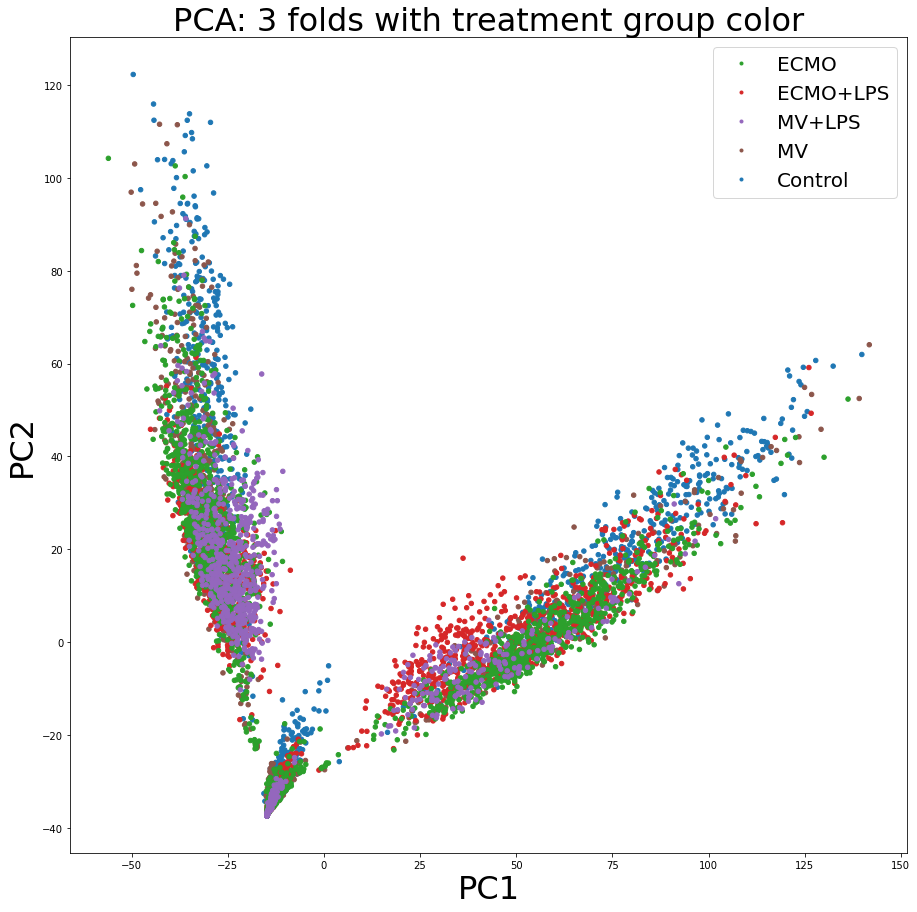

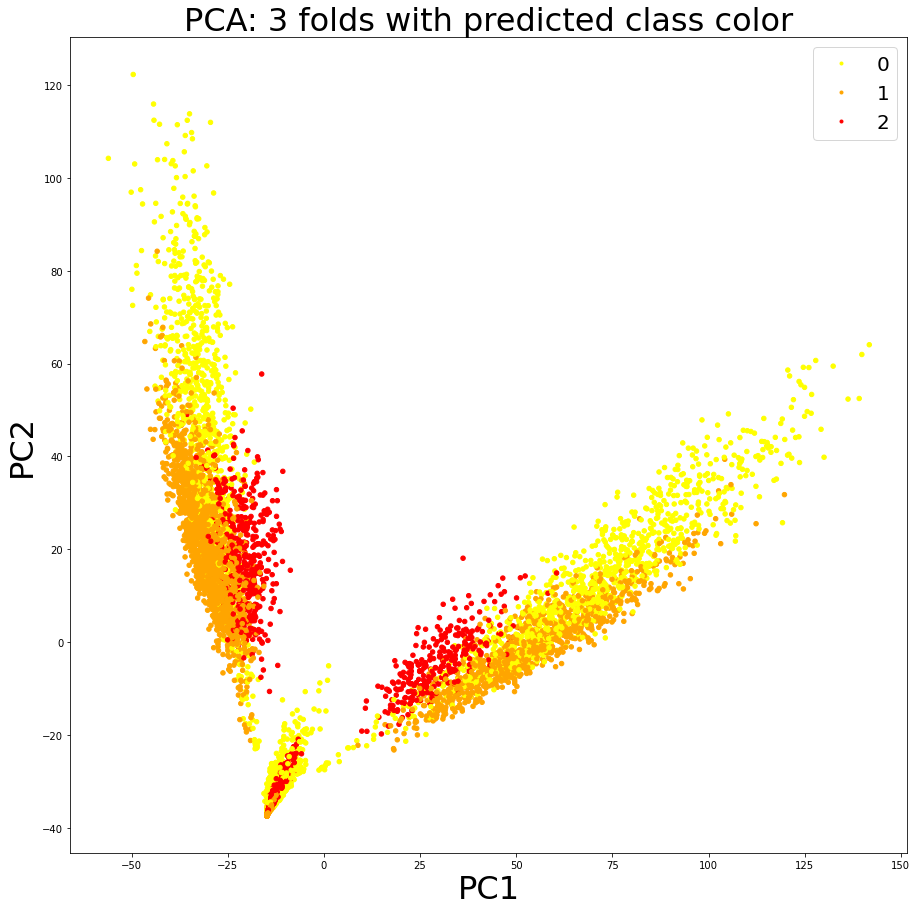

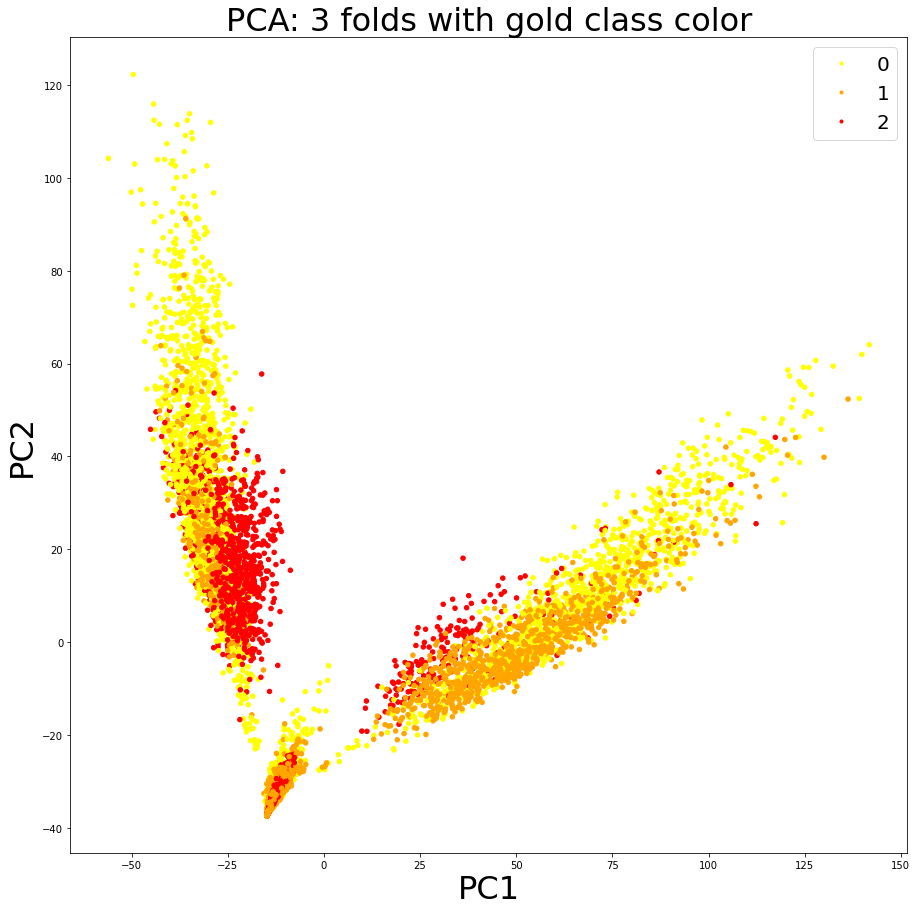

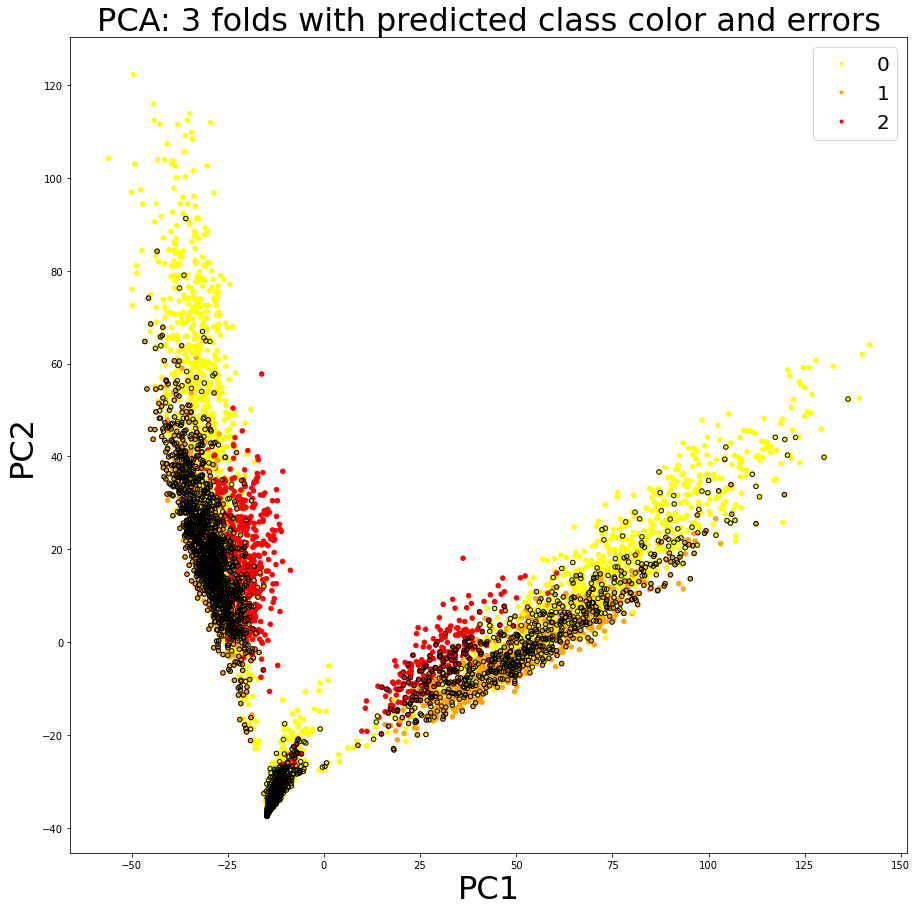

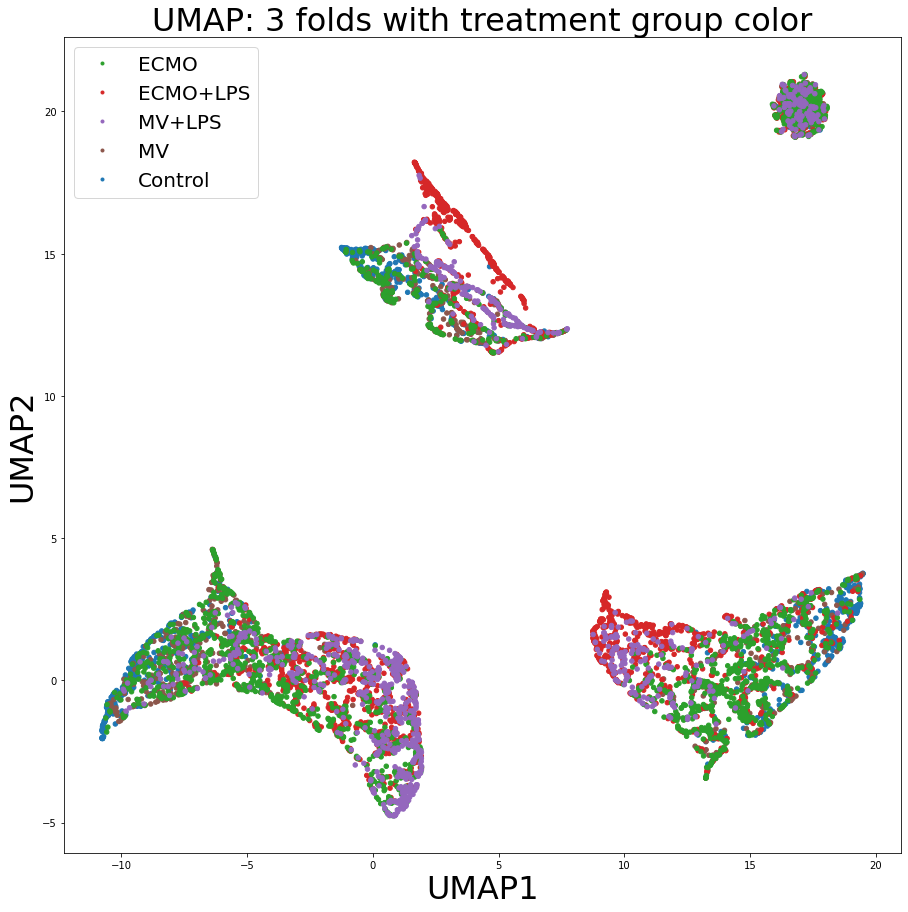

...

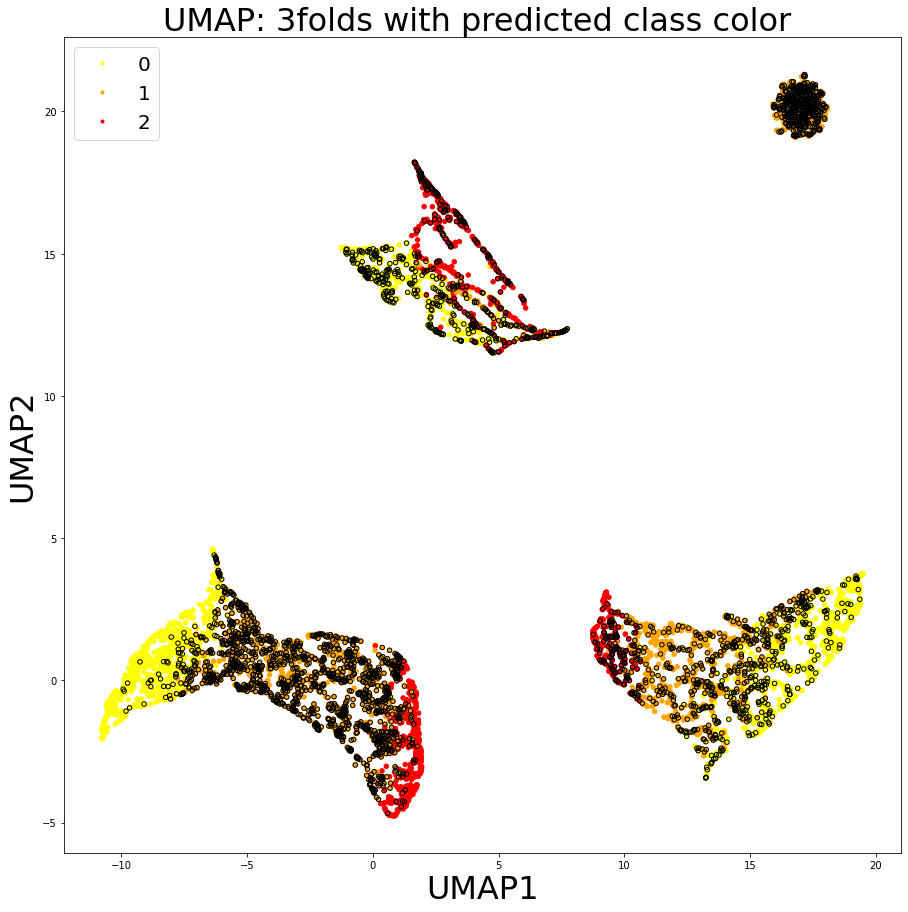

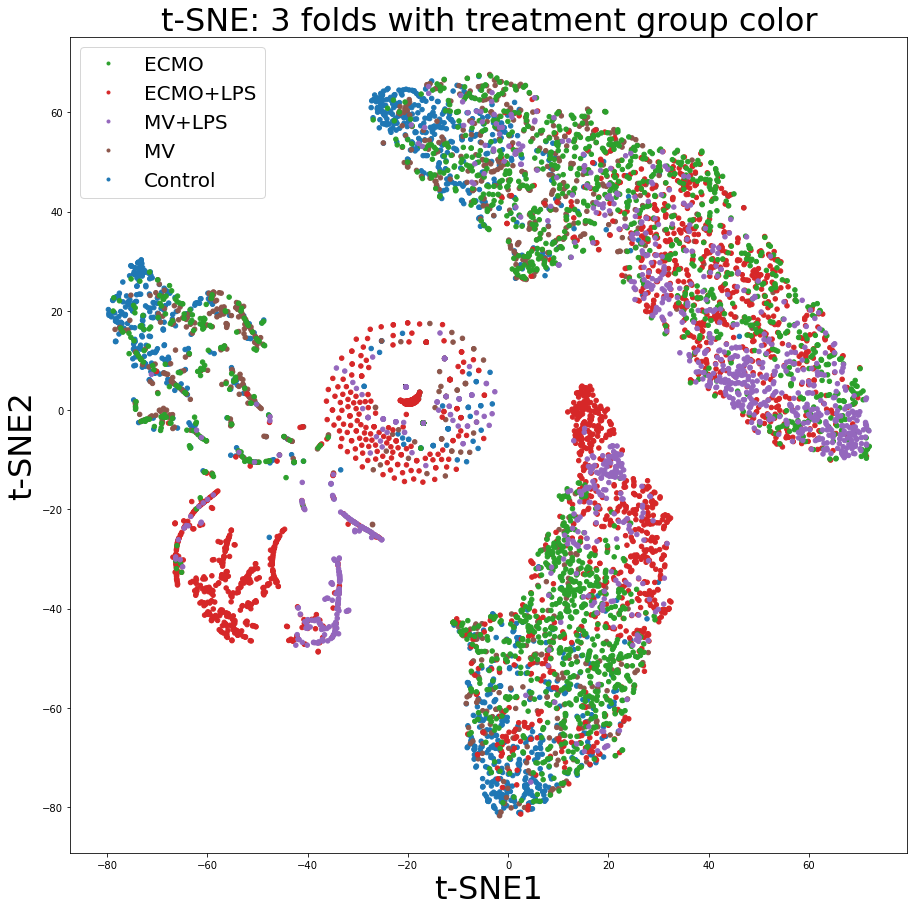

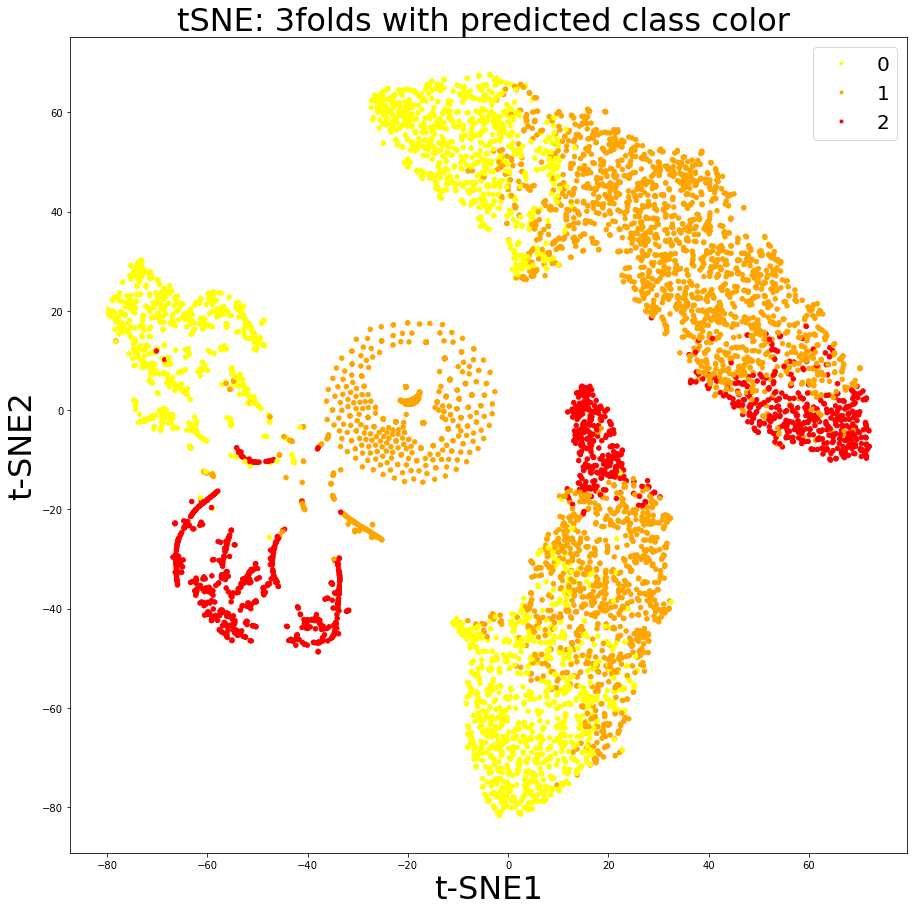

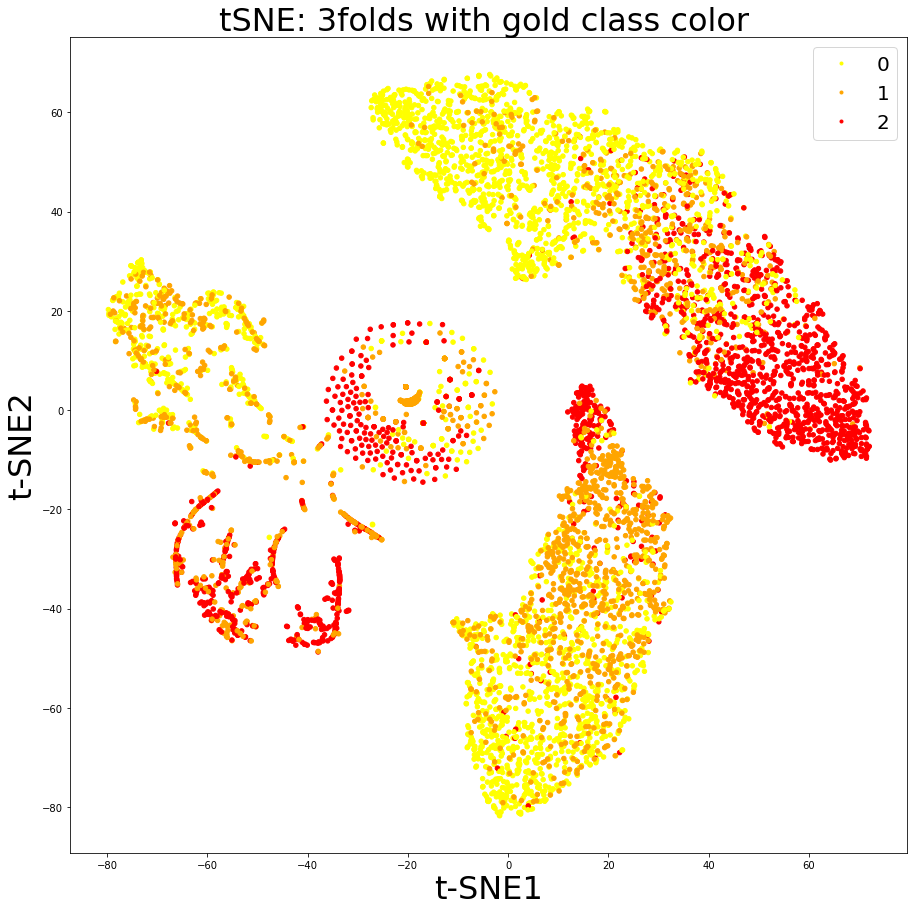

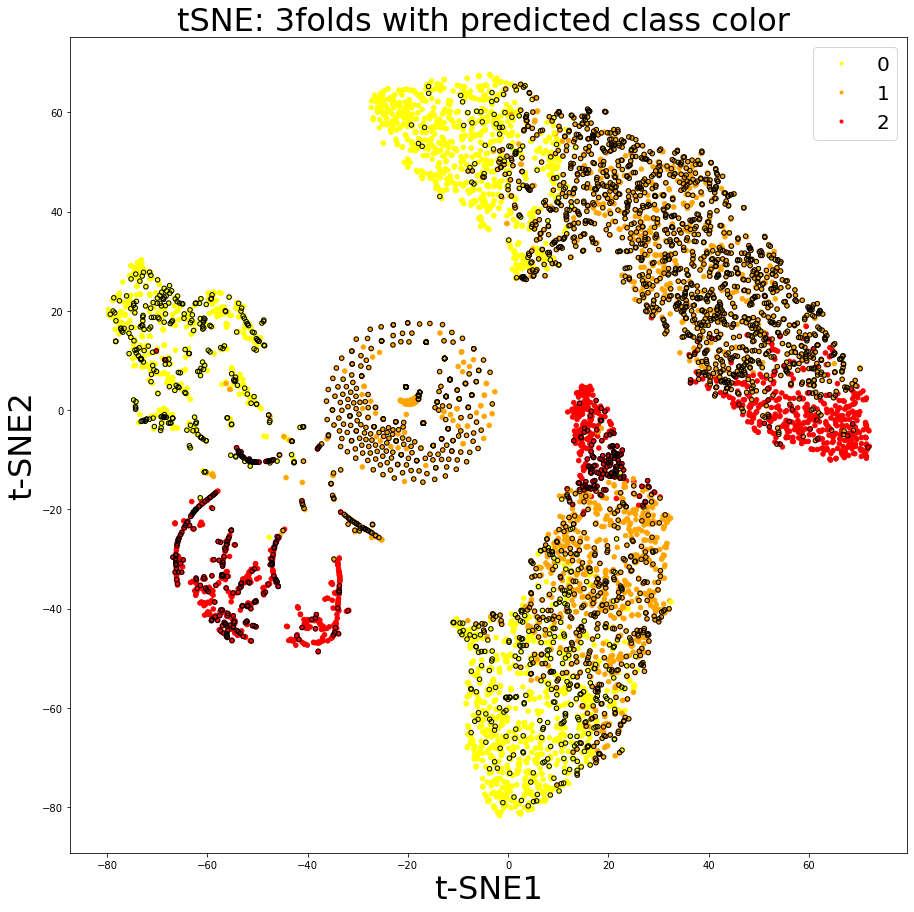

In [12]:
###############################################################
#### SO here I tried to see the clusters came out of three unsupervised algorithms in terms of groups and classes
#### From three folds

from sklearn.manifold import TSNE
#from umap import UMAP
import umap.umap_ as umap
from sklearn.decomposition import PCA




X_PCA = PCA(n_components=5).fit_transform(np_vector_data)
print("PCA done!{}",format(X_PCA.shape))


reducer = umap.UMAP()
X_UMAP = reducer.fit_transform(X_PCA)
print("UMAP done!{}",format(X_UMAP.shape))



X_TSNE= TSNE(n_components=2).fit_transform(np_vector_data)
print("TSNE done!{}",format(X_TSNE.shape))


clr = []
for l in image_color: ## color of treatment group as control, Mv, MV+LPS, ECMO, and ECMO+LPS
    clr.append(l)


class_clr = []
for l in Color_P_s:  ## color of predicted class
    class_clr.append(l)

    
g_class_clr = []
for l in Color_G_s:  ## color of gold class
    g_class_clr.append(l)

diff_class_clr = []
for l in Color_diff:  ## color of gold class
    diff_class_clr.append(l)

    
plt.figure(figsize=(15,15))
plt.scatter(X_PCA[:,0], X_PCA[:,1], c=clr, marker='.',s=80)
markers = [plt.Line2D([0,0],[0,0],color=color, marker='.', linestyle='') for color in color_map.values()]
plt.legend(markers,color_map.keys(), numpoints=1,fontsize=20)
plt.title('PCA: 3 folds with treatment group color',fontsize=32)
plt.xlabel('PC1',fontsize=32)
plt.ylabel('PC2',fontsize=32)

plt.figure(figsize=(15,15))
plt.scatter(X_PCA[:,0], X_PCA[:,1], c=class_clr, marker='.',s=80)
# The following two lines generate custom fake lines that will be used as legend entries:
markers = [plt.Line2D([0,0],[0,0],color=color, marker='.', linestyle='') for color in class_color_map.values()]
plt.legend(markers,class_color_map.keys(), numpoints=1,fontsize=20)
plt.title('PCA: 3 folds with predicted class color',fontsize=32)
plt.xlabel('PC1',fontsize=32)
plt.ylabel('PC2',fontsize=32)


plt.figure(figsize=(15,15))
plt.scatter(X_PCA[:,0], X_PCA[:,1], c=g_class_clr, marker='.',s=80)
# The following two lines generate custom fake lines that will be used as legend entries:
markers = [plt.Line2D([0,0],[0,0],color=color, marker='.', linestyle='') for color in class_color_map.values()]
plt.legend(markers,class_color_map.keys(), numpoints=1,fontsize=20)
plt.title('PCA: 3 folds with gold class color',fontsize=32)
plt.xlabel('PC1',fontsize=32)
plt.ylabel('PC2',fontsize=32)

###########################################################

plt.figure(figsize=(15,15))
plt.scatter(X_PCA[:,0], X_PCA[:,1], c=class_clr, marker='.',s=80)
# The following two lines generate custom fake lines that will be used as legend entries:
markers = [plt.Line2D([0,0],[0,0],color=color, marker='.', linestyle='') for color in class_color_map.values()]
plt.legend(markers,class_color_map.keys(), numpoints=1,fontsize=20)
plt.title('PCA: 3 folds with predicted class color and errors',fontsize=32)
plt.xlabel('PC1',fontsize=32)
plt.ylabel('PC2',fontsize=32)

#plt.figure(figsize=(15,15))
plt.scatter(X_PCA[:,0], X_PCA[:,1], edgecolors=diff_class_clr, marker='o',s=20, facecolors='none')
markers = [plt.Line2D([0,0],[0,0],color=color, marker='.', linestyle='') for color in diff_map.values()]
#plt.legend(markers,diff_map.keys(), numpoints=1)
#plt.savefig('c3class/PCA_fig_all_folds_fc2_diff_map.png')
#plt.title('PCA: 3 folds with treatment group color')

############################################################


plt.figure(figsize=(15,15))
plt.scatter(X_UMAP[:,0], X_UMAP[:,1], c=clr, marker='.',s=80)
markers = [plt.Line2D([0,0],[0,0],color=color, marker='.', linestyle='') for color in color_map.values()]
plt.legend(markers,color_map.keys(), numpoints=1,fontsize=20)
plt.title('UMAP: 3 folds with treatment group color',fontsize=32)
plt.xlabel('UMAP1',fontsize=32)
plt.ylabel('UMAP2',fontsize=32)

plt.figure(figsize=(15,15))
plt.scatter(X_UMAP[:,0], X_UMAP[:,1], c=class_clr, marker='.',s=80)
markers = [plt.Line2D([0,0],[0,0],color=color, marker='.', linestyle='') for color in class_color_map.values()]
plt.legend(markers,class_color_map.keys(), numpoints=1,fontsize=20)
plt.title('UMAP: 3folds with predicted class color ',fontsize=32)
plt.xlabel('UMAP1',fontsize=32)
plt.ylabel('UMAP2',fontsize=32)



plt.figure(figsize=(15,15))
plt.scatter(X_UMAP[:,0], X_UMAP[:,1], c=g_class_clr, marker='.',s=80)
markers = [plt.Line2D([0,0],[0,0],color=color, marker='.', linestyle='') for color in class_color_map.values()]
plt.legend(markers,class_color_map.keys(), numpoints=1,fontsize=20)
plt.title('UMAP : 3 fold with gold class color',fontsize=32)
plt.xlabel('UMAP1',fontsize=32)
plt.ylabel('UMAP2',fontsize=32)




#############################################################

plt.figure(figsize=(15,15))
plt.scatter(X_UMAP[:,0], X_UMAP[:,1], c=class_clr, marker='.',s=80)
markers = [plt.Line2D([0,0],[0,0],color=color, marker='.', linestyle='') for color in class_color_map.values()]
plt.legend(markers,class_color_map.keys(), numpoints=1,fontsize=20)
plt.title('UMAP: 3folds with predicted class color ',fontsize=32)
plt.xlabel('UMAP1',fontsize=32)
plt.ylabel('UMAP2',fontsize=32)


#plt.figure(figsize=(15,15))
plt.scatter(X_UMAP[:,0], X_UMAP[:,1], edgecolors=diff_class_clr, marker='o',s=20, facecolors='none')
markers = [plt.Line2D([0,0],[0,0],color=color, marker='.', linestyle='') for color in diff_map.values()]


###################################################################################






plt.figure(figsize=(15,15))
plt.scatter(X_TSNE[:,0], X_TSNE[:,1], c=clr,label=clr, marker='.',s=80)
markers = [plt.Line2D([0,0],[0,0],color=color, marker='.', linestyle='') for color in color_map.values()]
plt.legend(markers,color_map.keys(), numpoints=1,fontsize=20)
plt.title('t-SNE: 3 folds with treatment group color',fontsize=32)
plt.xlabel('t-SNE1',fontsize=32)
plt.ylabel('t-SNE2',fontsize=32)



plt.figure(figsize=(15,15))
plt.scatter(X_TSNE[:,0], X_TSNE[:,1], c=class_clr,label=clr, marker='.',s=80)
markers = [plt.Line2D([0,0],[0,0],color=color, marker='.', linestyle='') for color in class_color_map.values()]
plt.legend(markers,class_color_map.keys(), numpoints=1,fontsize=20)
plt.title('tSNE: 3folds with predicted class color ',fontsize=32)
plt.xlabel('t-SNE1',fontsize=32)
plt.ylabel('t-SNE2',fontsize=32)


plt.figure(figsize=(15,15))
plt.scatter(X_TSNE[:,0], X_TSNE[:,1], c=g_class_clr,label=clr, marker='.',s=80)
markers = [plt.Line2D([0,0],[0,0],color=color, marker='.', linestyle='') for color in class_color_map.values()]
plt.legend(markers,class_color_map.keys(), numpoints=1,fontsize=20)
plt.title('tSNE: 3folds with gold class color ',fontsize=32)
plt.xlabel('t-SNE1',fontsize=32)
plt.ylabel('t-SNE2',fontsize=32)


##############################################################

plt.figure(figsize=(15,15))
plt.scatter(X_TSNE[:,0], X_TSNE[:,1], c=class_clr,label=clr, marker='.',s=80)
markers = [plt.Line2D([0,0],[0,0],color=color, marker='.', linestyle='') for color in class_color_map.values()]
plt.legend(markers,class_color_map.keys(), numpoints=1,fontsize=20)
plt.title('tSNE: 3folds with predicted class color ',fontsize=32)
plt.xlabel('t-SNE1',fontsize=32)
plt.ylabel('t-SNE2',fontsize=32)

#plt.figure(figsize=(15,15))
plt.scatter(X_TSNE[:,0], X_TSNE[:,1], edgecolors=diff_class_clr, marker='o',s=20, facecolors='none')
markers = [plt.Line2D([0,0],[0,0],color=color, marker='.', linestyle='') for color in diff_map.values()]



#############################################################




PCA_out = np.c_[total_img_name,X_PCA]
TSNE_out = np.c_[total_img_name,X_TSNE]
UMAP_out = np.c_[total_img_name,X_UMAP]



with open ('c3class/pca_all_folds.txt','w') as r_f_pca:
    for i in range(len(total_img_name)):
        print(PCA_out[i][0].rsplit('/')[-1],PCA_out[i][1],PCA_out[i][2],sep = ',',file = r_f_pca)
with open ('c3class/tsne_all_folds.txt','w') as r_f_tsne:
    for i in range(len(total_img_name)):
        print(TSNE_out[i][0].rsplit('/')[-1],TSNE_out[i][1],TSNE_out[i][2],sep = ',',file = r_f_tsne)
with open ('c3class/umap_all_folds.txt','w') as r_f_umap:
    for i in range(len(total_img_name)):
        print(UMAP_out[i][0].rsplit('/')[-1],UMAP_out[i][1],UMAP_out[i][2],sep = ',',file = r_f_umap)

### Clusters with original images

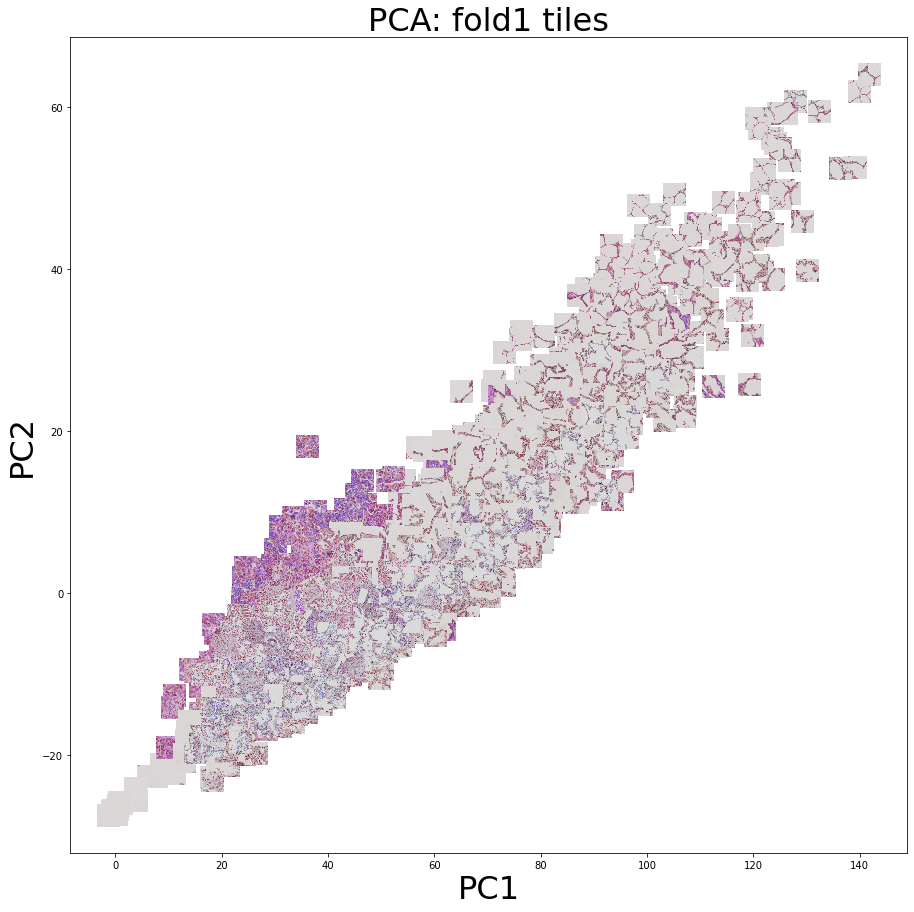

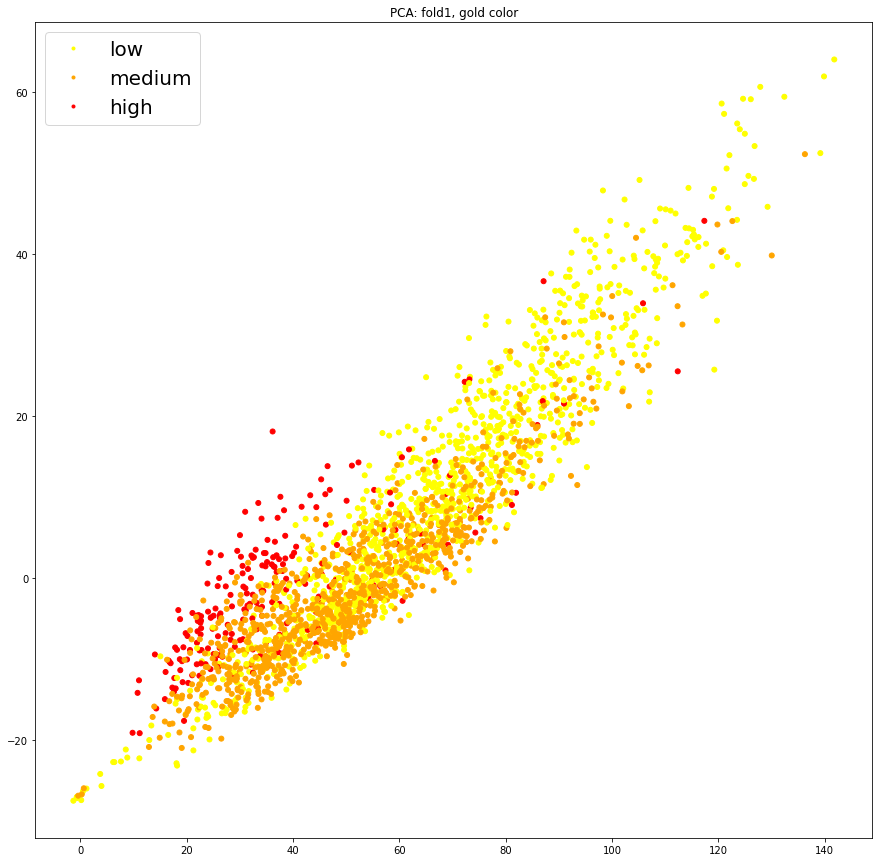

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
from matplotlib.cbook import get_sample_data
import glob

def main():
    
    x = X_PCA[0:2196,0]
    y = X_PCA[0:2196,1]
    c = diff_class_clr[0:2196]
    paths = total_img_name[0:2196]#glob.glob('3rd_part_validation/*.tif')
 
    #########################################################################
    
    fig, ax = plt.subplots(figsize=(15,15))
    ax.set_title('PCA: fold1 tiles',fontsize=32)
    ax.set_xlabel('PC1',fontsize=32)
    ax.set_ylabel('PC2',fontsize=32)
    imscatter(x, y, paths, zoom=0.1, ax=ax)
    
    #########################################################################
    fig, ax = plt.subplots(figsize=(15,15))
    ax.scatter(X_PCA[0:2196,0], X_PCA[0:2196,1], s=100,c=g_class_clr[0:2196], marker='.')
    ax.set_title('PCA: fold1, gold color')
    ax.legend(markers,['low','medium','high'], numpoints=1,fontsize=20)
    plt.show()

def imscatter(x, y, paths, ax=None, zoom=.1):
    if ax is None:
        ax = plt.gca()
    x, y = np.atleast_1d(x, y)
    artists = []
    for x0, y0,p in zip(x, y,paths):
        im = OffsetImage(cv2.imread('1st_part_validation/'+p), zoom=zoom)
        ab = AnnotationBbox(im, (x0, y0), xycoords='data', frameon=False)
        artists.append(ax.add_artist(ab))
    ax.update_datalim(np.column_stack([x, y]))
    ax.autoscale()
    return artists

main()

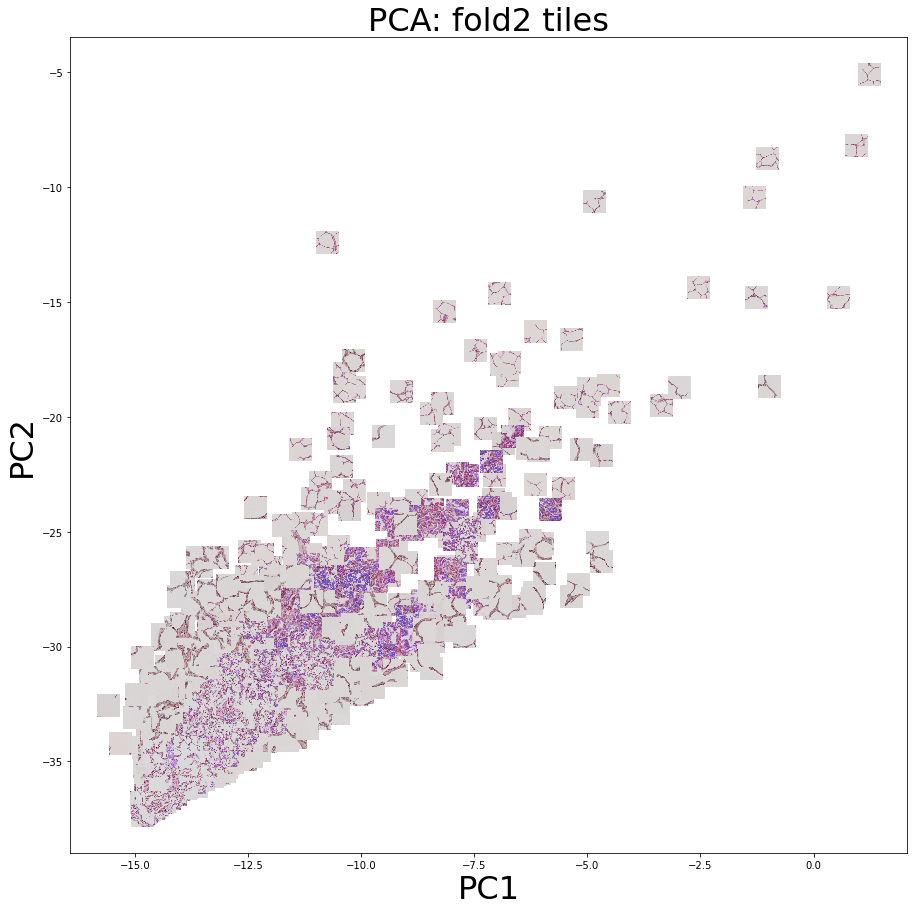

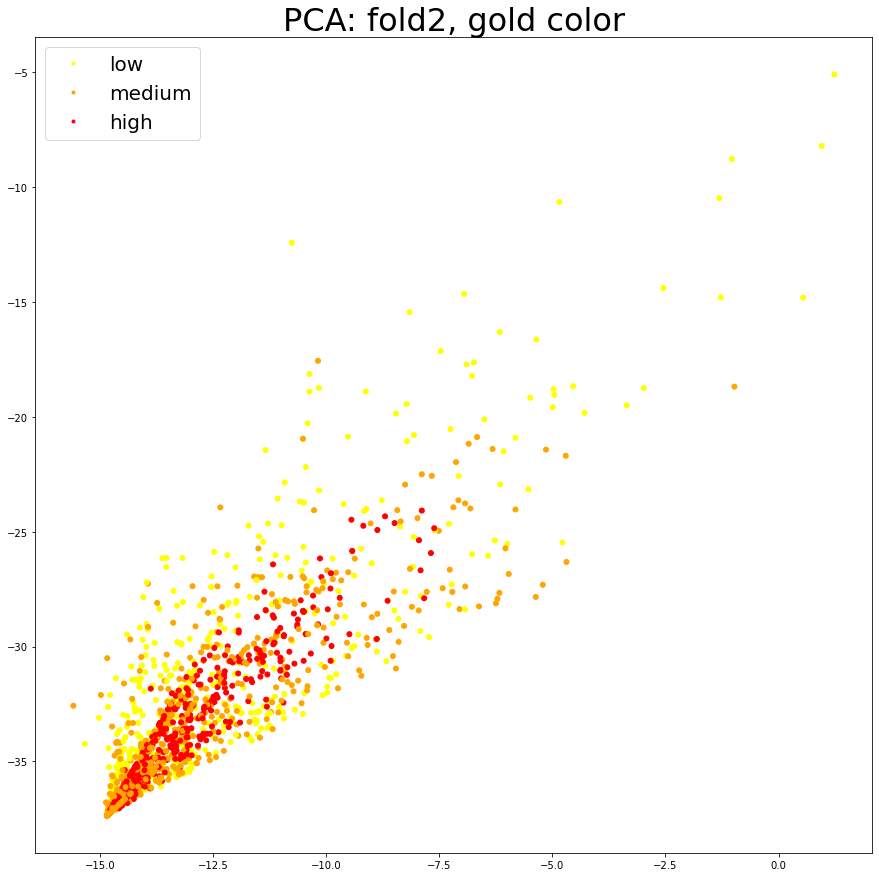

In [29]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
from matplotlib.cbook import get_sample_data
import glob
markers = [plt.Line2D([0,0],[0,0],color=color, marker='.', linestyle='') for color in class_color_map.values()]
def main():
    
    x = X_PCA[2196:2196+2789,0]
    y = X_PCA[2196:2196+2789,1]
    c = diff_class_clr[2196:2196+2789]
    
    paths = total_img_name[2196:2196+2789]#glob.glob('3rd_part_validation/*.tif')
    '''
    fig, ax = plt.subplots(figsize=(15,15))
    ax.set_title('PCA: fold2 tiles')
    
    new_x    = x[c!='none']
    new_y    = y[c!='none']
    new_path = np.array(paths)[(c!='none')] 
    imscatter(new_x[0], new_y[0], new_path[0], zoom=0.1, ax=ax)
    '''
    
    
    fig, ax = plt.subplots(figsize=(15,15))
    ax.set_title('PCA: fold2 tiles',fontsize=32)
    ax.set_xlabel('PC1',fontsize=32)
    ax.set_ylabel('PC2',fontsize=32)
    imscatter(x, y, paths, zoom=0.1, ax=ax)
    
    ######################################################
    fig, ax = plt.subplots(figsize=(15,15))
    ax.scatter(X_PCA[2196:2196+2789,0], X_PCA[2196:2196+2789,1], s=100,c=g_class_clr[2196:2196+2789], marker='.')
    ax.set_title('PCA: fold2, gold color',fontsize=32)
    ax.legend(markers,['low','medium','high'], numpoints=1,fontsize=20)
    plt.show()

def imscatter(x, y, paths, ax=None, zoom=.1):
    if ax is None:
        ax = plt.gca()
    x, y = np.atleast_1d(x, y)
    artists = []
    for x0, y0,p in zip(x, y,paths):
        im = OffsetImage(cv2.imread('2nd_part_validation/'+p), zoom=zoom)
        ab = AnnotationBbox(im, (x0, y0), xycoords='data', frameon=False)
        artists.append(ax.add_artist(ab))
    ax.update_datalim(np.column_stack([x, y]))
    ax.autoscale()
    return artists

main()

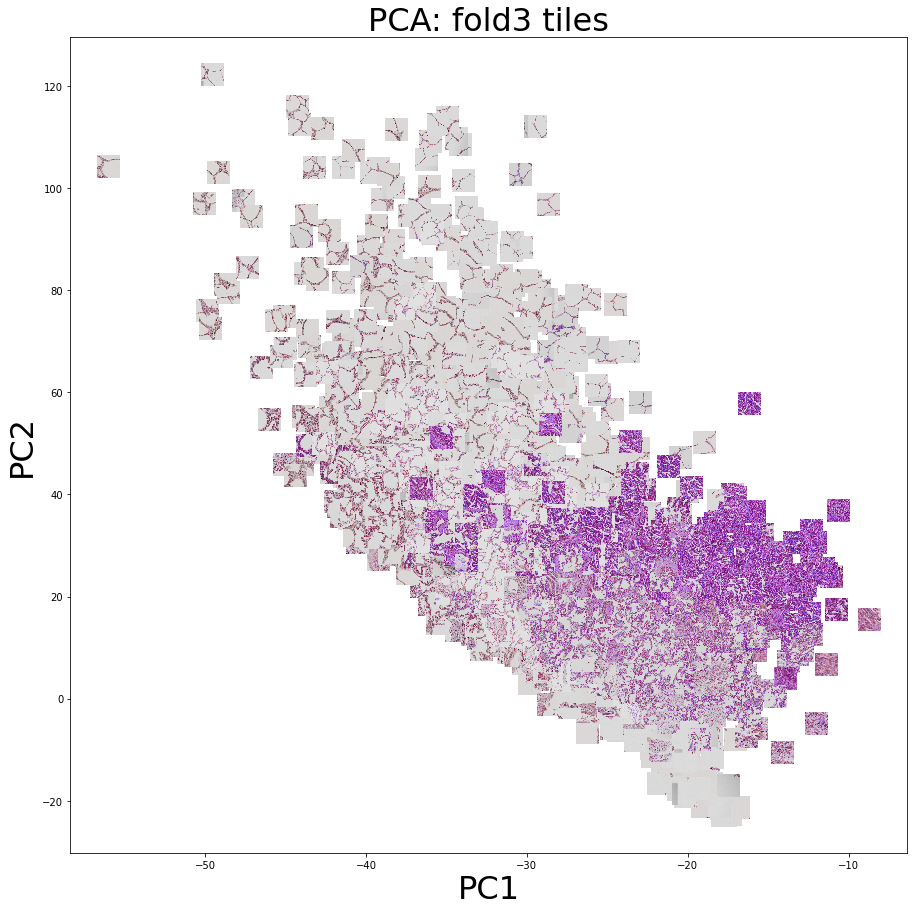

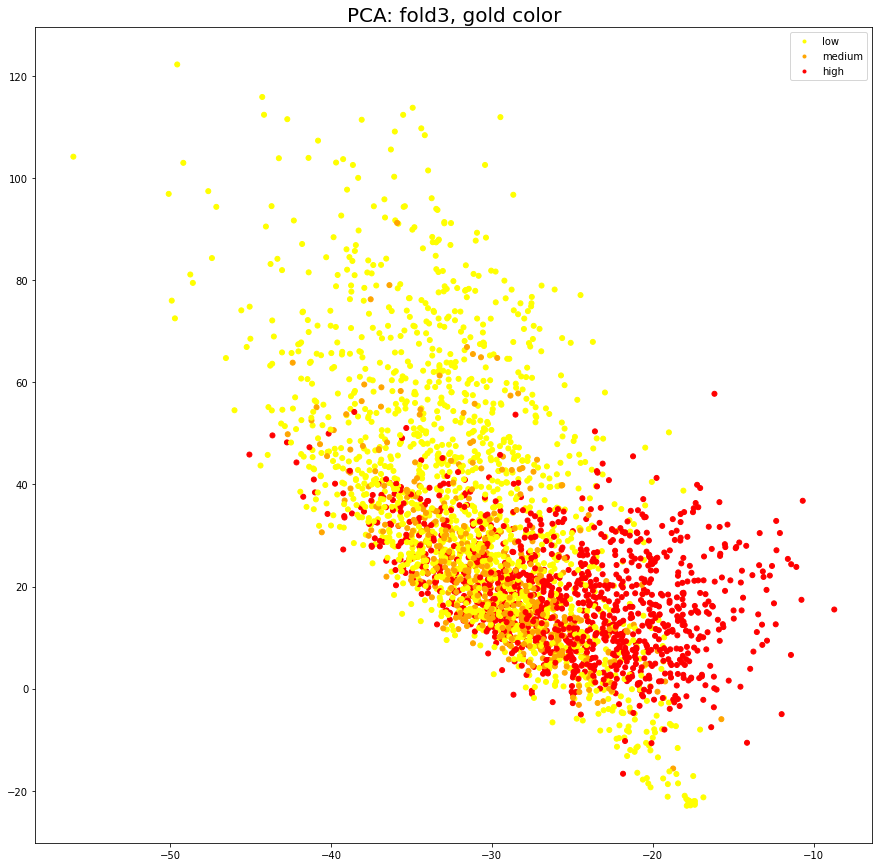

In [30]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
from matplotlib.cbook import get_sample_data
import glob

def main():
    #x = np.linspace(0, 10, 20)
    #ax1.scatter(X_UMAP[2196+2789:,0], X_UMAP[2196+2789:,1], c=g_class_clr[2196+2789:], marker='.')
    x = X_PCA[2196+2789:,0]
    y = X_PCA[2196+2789:,1]
    
    
    c = diff_class_clr[2196+2789:]
    
    paths = total_img_name[2196+2789:]#glob.glob('3rd_part_validation/*.tif')
    '''
    fig, ax = plt.subplots(figsize=(15,15))
    ax.set_title('PCA: fold3 tiles')
    
    
    
    new_x    = x[c!='none']
    new_y    = y[c!='none']
  
    new_path = np.array(paths)[(c!='none')] 
    imscatter(new_x[0], new_y[0], new_path[0], zoom=0.1, ax=ax)
    '''
    
    
    fig, ax = plt.subplots(figsize=(15,15))
    ax.set_title('PCA: fold3 tiles',fontsize=32)
    ax.set_xlabel('PC1',fontsize=32)
    ax.set_ylabel('PC2',fontsize=32)
    imscatter(x, y, paths, zoom=0.1, ax=ax)
    
    #########################################
    fig, ax = plt.subplots(figsize=(15,15))
    ax.scatter(X_PCA[2196+2789:,0], X_PCA[2196+2789:,1], s=100,c=g_class_clr[2196+2789:], marker='.')
    ax.set_title('PCA: fold3, gold color',fontsize=20)
    ax.legend(markers,['low','medium','high'], numpoints=1)
    plt.show()

def imscatter(x, y, paths, ax=None, zoom=.1):
    if ax is None:
        ax = plt.gca()
    #try:
     #   image = cv2.imread(image_path)
    #except TypeError:
        # Likely already an array...
     #   pass
    #im = OffsetImage(image, zoom=zoom)
    x, y = np.atleast_1d(x, y)
    artists = []
    for x0, y0,p in zip(x, y,paths):
        im = OffsetImage(cv2.imread('3rd_part_validation/'+p), zoom=zoom)
        ab = AnnotationBbox(im, (x0, y0), xycoords='data', frameon=False)
        artists.append(ax.add_artist(ab))
    ax.update_datalim(np.column_stack([x, y]))
    ax.autoscale()
    return artists

main()

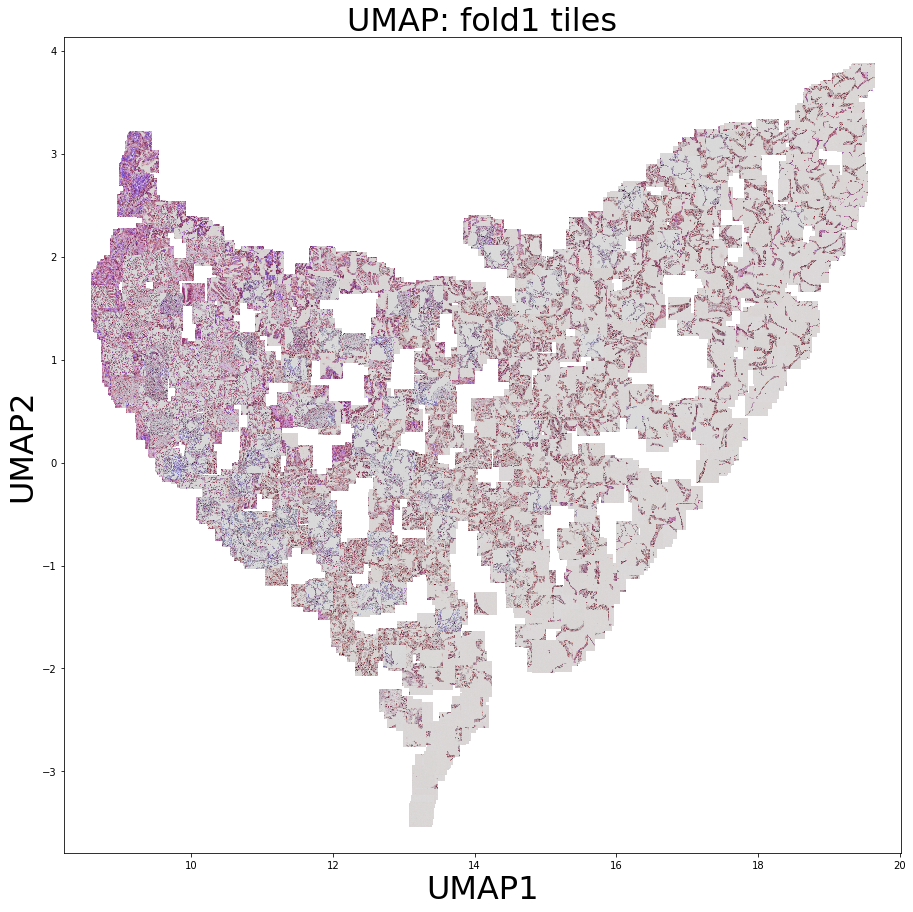

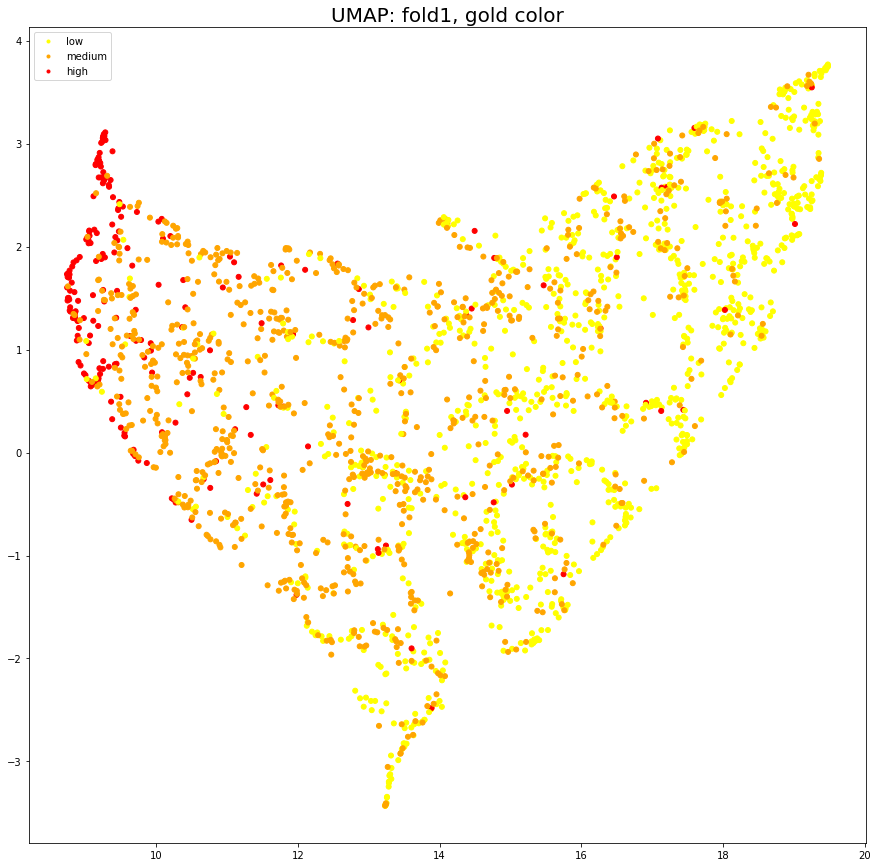

In [31]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
from matplotlib.cbook import get_sample_data
import glob

def main():
    #x = np.linspace(0, 10, 20)
    #ax1.scatter(X_UMAP[2196+2789:,0], X_UMAP[2196+2789:,1], c=g_class_clr[2196+2789:], marker='.')
    x = X_UMAP[0:2196,0]
    y = X_UMAP[0:2196,1]
    c = diff_class_clr[0:2196]
    
    paths = total_img_name[0:2196]#glob.glob('3rd_part_validation/*.tif')
    '''
    fig, ax = plt.subplots(figsize=(15,15))
    ax.set_title('UMAP: fold1 tiles')
    
    new_x    = x[c!='none']
    new_y    = y[c!='none']
    print(new_x)
    new_path = np.array(paths)[(c!='none')] 
    print(new_path)
    print(new_y[0])
    imscatter(new_x[0], new_y[0], new_path[0], zoom=0.1, ax=ax)
    '''
    
    fig, ax = plt.subplots(figsize=(15,15))
    ax.set_title('UMAP: fold1 tiles',fontsize=32)
    ax.set_xlabel('UMAP1',fontsize=32)
    ax.set_ylabel('UMAP2',fontsize=32)
    imscatter(x, y, paths, zoom=0.1, ax=ax)
    
    ##############################################
    fig, ax = plt.subplots(figsize=(15,15))
    ax.scatter(X_UMAP[0:2196,0], X_UMAP[0:2196,1], s=100,c=g_class_clr[0:2196], marker='.')
    ax.set_title('UMAP: fold1, gold color',fontsize=20)
    ax.legend(markers,['low','medium','high'], numpoints=1)

    plt.show()

def imscatter(x, y, paths, ax=None, zoom=.1):
    if ax is None:
        ax = plt.gca()
    x, y = np.atleast_1d(x, y)
    artists = []
    for x0, y0,p in zip(x, y,paths):
        im = OffsetImage(cv2.imread('1st_part_validation/'+p), zoom=zoom)
        ab = AnnotationBbox(im, (x0, y0), xycoords='data', frameon=False)
        artists.append(ax.add_artist(ab))
    ax.update_datalim(np.column_stack([x, y]))
    ax.autoscale()
    return artists

main()

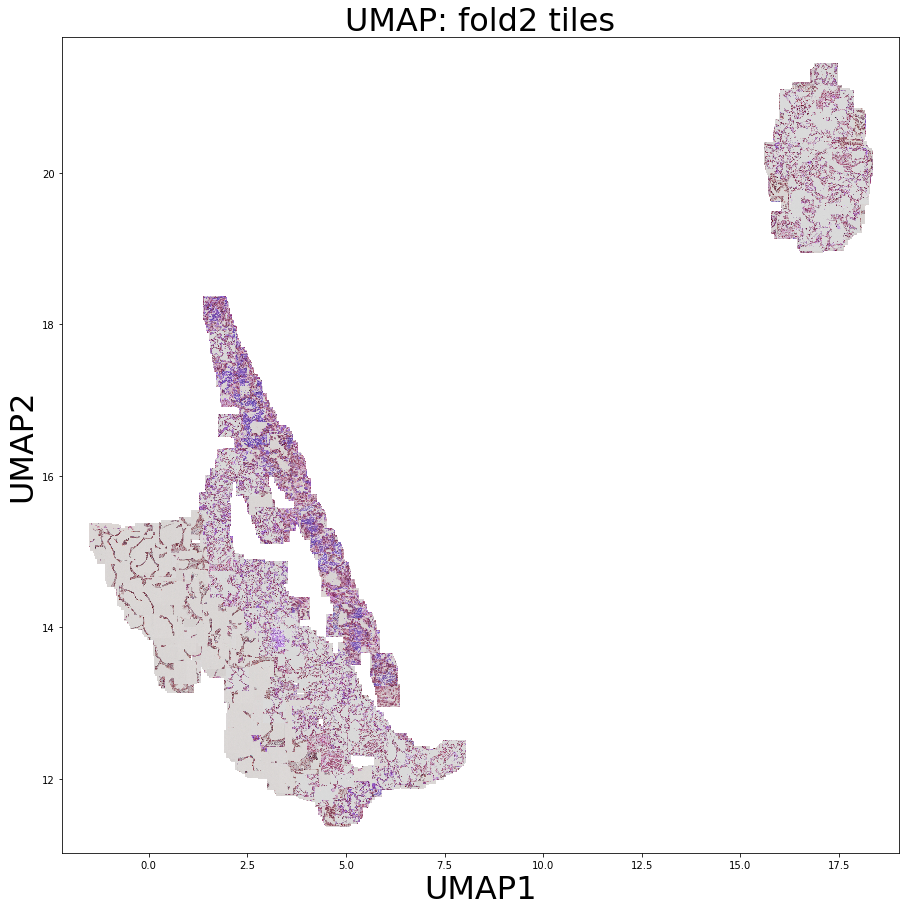

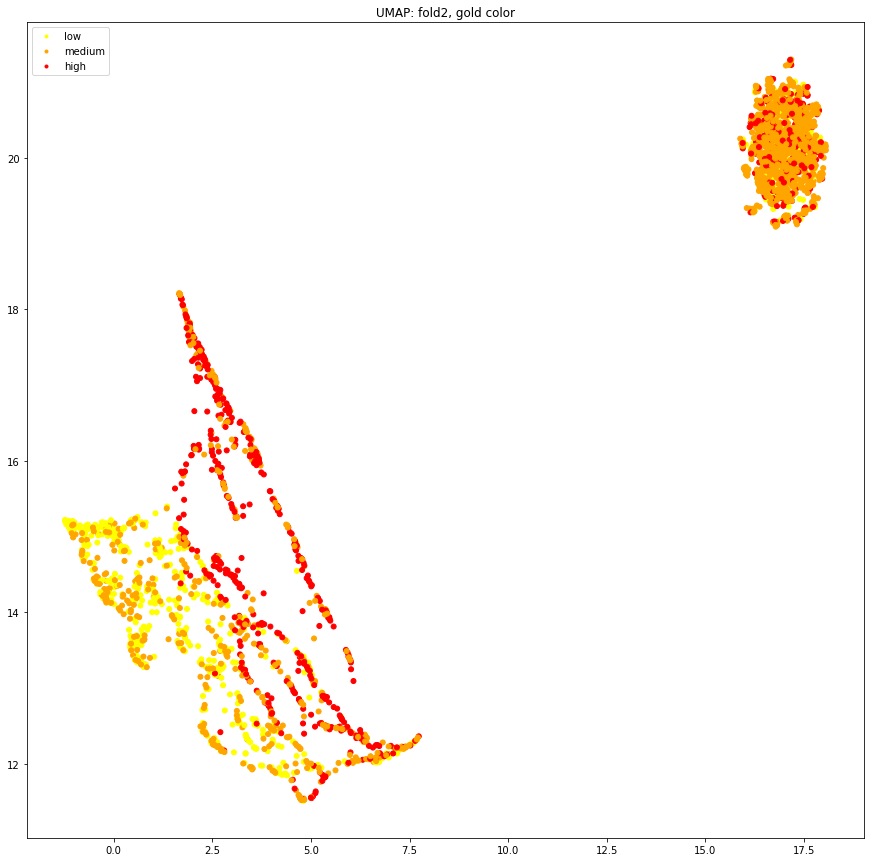

In [32]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
from matplotlib.cbook import get_sample_data
import glob
markers = [plt.Line2D([0,0],[0,0],color=color, marker='.', linestyle='') for color in class_color_map.values()]
def main():
    #x = np.linspace(0, 10, 20)
    #ax1.scatter(X_UMAP[2196+2789:,0], X_UMAP[2196+2789:,1], c=g_class_clr[2196+2789:], marker='.')
    x = X_UMAP[2196:2196+2789,0]
    y = X_UMAP[2196:2196+2789,1]
    c = diff_class_clr[2196:2196+2789]
    
    paths = total_img_name[2196:2196+2789]#glob.glob('3rd_part_validation/*.tif')
    '''
    fig, ax = plt.subplots(figsize=(15,15))
    ax.set_title('UMAP: fold2 tiles')
    
    
    
    new_x    = x[c!='none']
    new_y    = y[c!='none']
  
    new_path = np.array(paths)[(c!='none')] 
    imscatter(new_x[0], new_y[0], new_path[0], zoom=0.1, ax=ax)
    
    '''
    
    
    fig, ax = plt.subplots(figsize=(15,15))
    ax.set_title('UMAP: fold2 tiles',fontsize=32)
    ax.set_xlabel('UMAP1',fontsize=32)
    ax.set_ylabel('UMAP2',fontsize=32)
    imscatter(x, y, paths, zoom=0.1, ax=ax)
    ###############################################################
    fig, ax = plt.subplots(figsize=(15,15))
    ax.scatter(X_UMAP[2196:2196+2789,0], X_UMAP[2196:2196+2789,1], s=100,c=g_class_clr[2196:2196+2789], marker='.')
    ax.set_title('UMAP: fold2, gold color')
    ax.legend(markers,['low','medium','high'], numpoints=1)

    plt.show()

def imscatter(x, y, paths, ax=None, zoom=.1):
    if ax is None:
        ax = plt.gca()
    x, y = np.atleast_1d(x, y)
    artists = []
    for x0, y0,p in zip(x, y,paths):
        im = OffsetImage(cv2.imread('2nd_part_validation/'+p), zoom=zoom)
        ab = AnnotationBbox(im, (x0, y0), xycoords='data', frameon=False)
        artists.append(ax.add_artist(ab))
    ax.update_datalim(np.column_stack([x, y]))
    ax.autoscale()
    return artists

main()

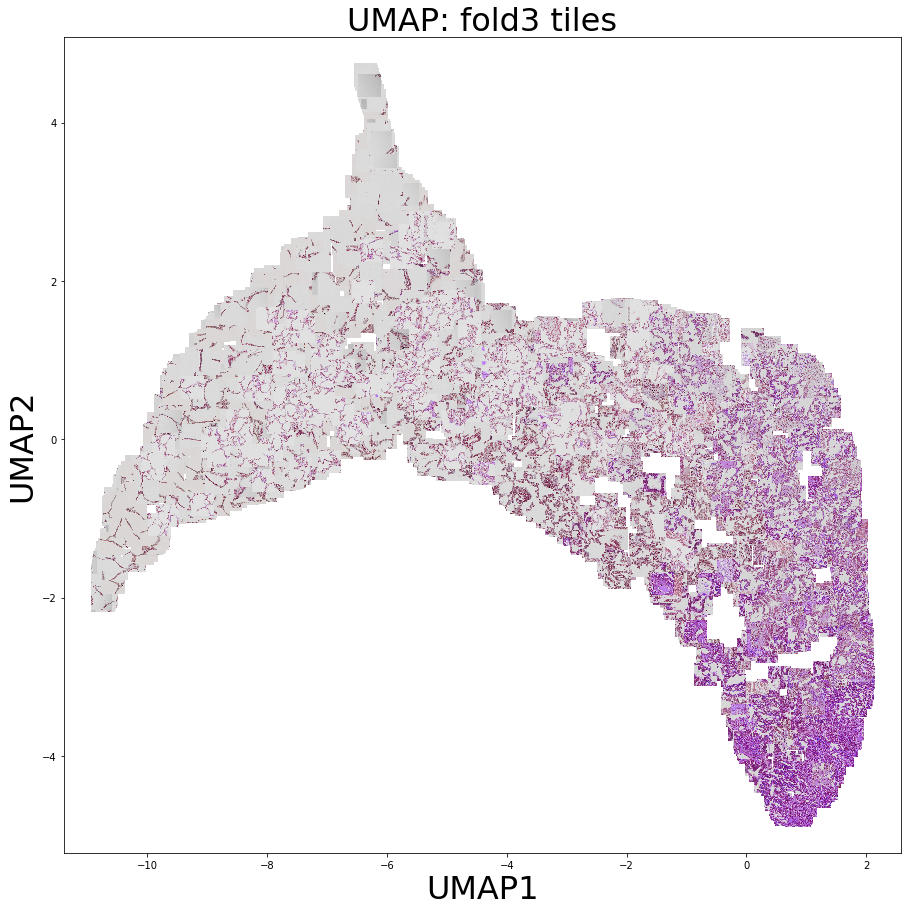

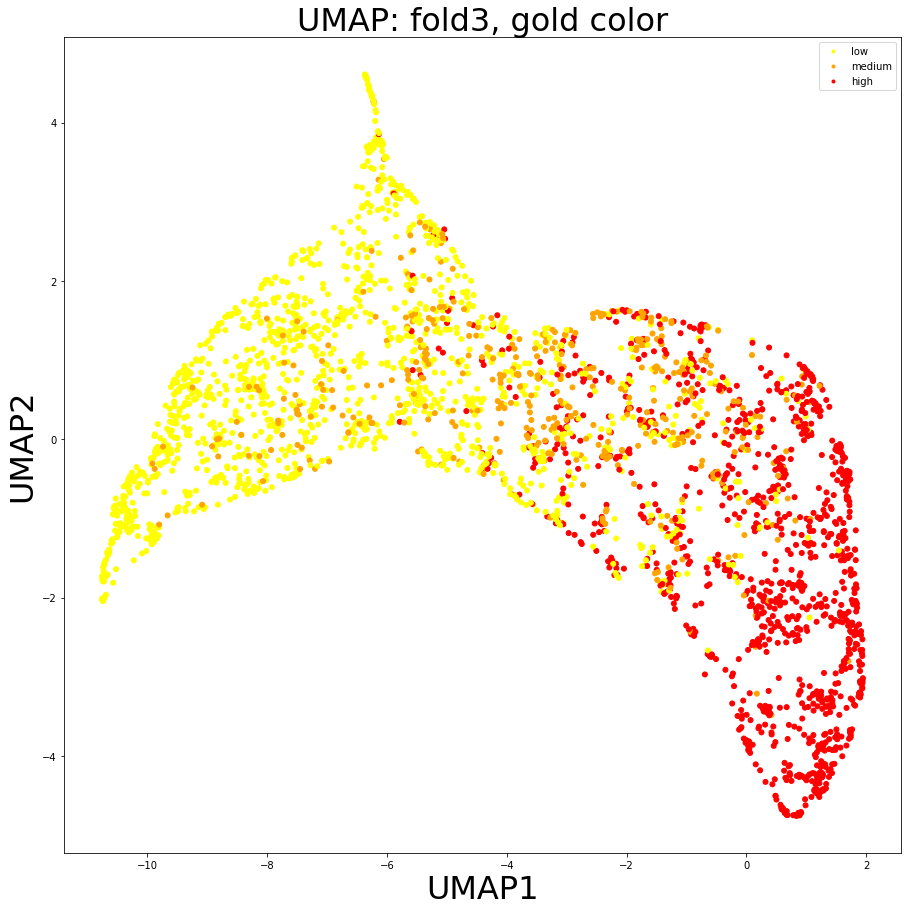

In [33]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
from matplotlib.cbook import get_sample_data
import glob

def main():
    #x = np.linspace(0, 10, 20)
    #ax1.scatter(X_UMAP[2196+2789:,0], X_UMAP[2196+2789:,1], c=g_class_clr[2196+2789:], marker='.')
    x = X_UMAP[2196+2789:,0]
    y = X_UMAP[2196+2789:,1]
    
    
    c = diff_class_clr[2196+2789:]
    
    paths = total_img_name[2196+2789:]#glob.glob('3rd_part_validation/*.tif')
    '''
    fig, ax = plt.subplots(figsize=(15,15))
    ax.set_title('UMAP: fold3 tiles')
    new_x    = x[c!='none']
    new_y    = y[c!='none']
  
    new_path = np.array(paths)[(c!='none')] 
    imscatter(new_x[0], new_y[0], new_path[0], zoom=0.1, ax=ax)
    '''
    
    
    fig, ax = plt.subplots(figsize=(15,15))
    ax.set_title('UMAP: fold3 tiles',fontsize=32)
    ax.set_xlabel('UMAP1',fontsize=32)
    ax.set_ylabel('UMAP2',fontsize=32)
    imscatter(x, y, paths, zoom=0.1, ax=ax)
    
    
    fig, ax = plt.subplots(figsize=(15,15))
    ax.scatter(X_UMAP[2196+2789:,0], X_UMAP[2196+2789:,1], s=100,c=g_class_clr[2196+2789:], marker='.')
    ax.set_title('UMAP: fold3, gold color',fontsize=32)
    ax.set_xlabel('UMAP1',fontsize=32)
    ax.set_ylabel('UMAP2',fontsize=32)
    ax.legend(markers,['low','medium','high'], numpoints=1)

    plt.show()

def imscatter(x, y, paths, ax=None, zoom=.1):
    if ax is None:
        ax = plt.gca()
    #try:
     #   image = cv2.imread(image_path)
    #except TypeError:
        # Likely already an array...
     #   pass
    #im = OffsetImage(image, zoom=zoom)
    x, y = np.atleast_1d(x, y)
    artists = []
    for x0, y0,p in zip(x, y,paths):
        im = OffsetImage(cv2.imread('3rd_part_validation/'+p), zoom=zoom)
        ab = AnnotationBbox(im, (x0, y0), xycoords='data', frameon=False)
        artists.append(ax.add_artist(ab))
    ax.update_datalim(np.column_stack([x, y]))
    ax.autoscale()
    return artists

main()

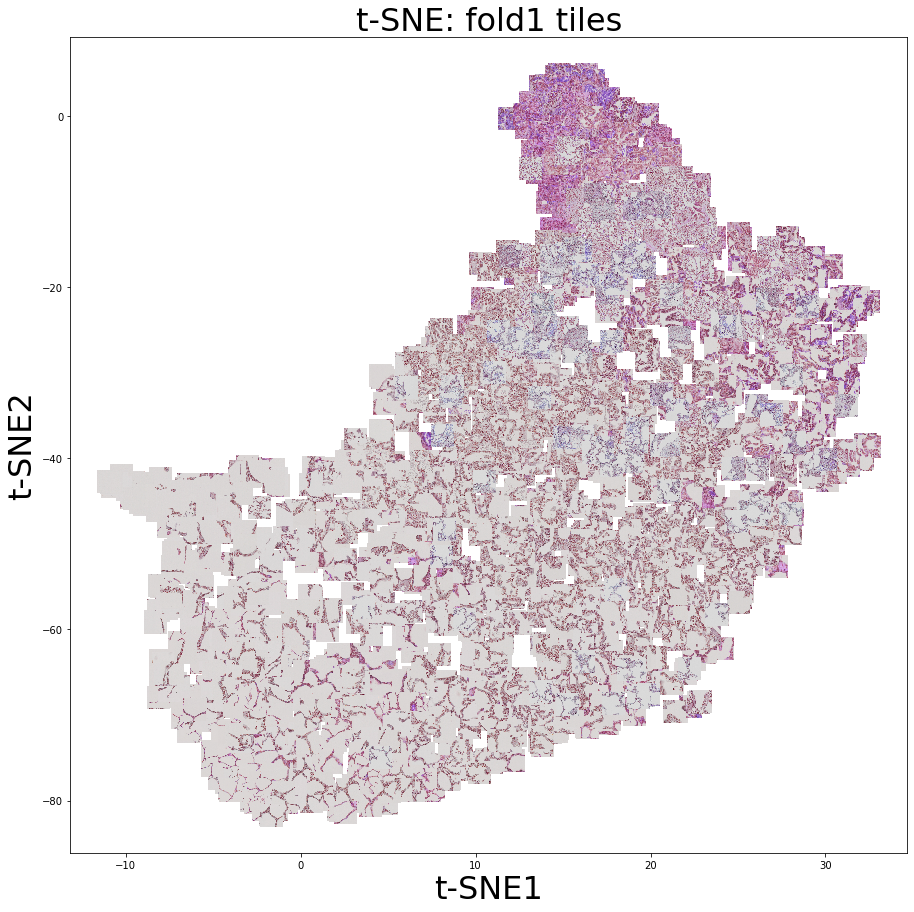

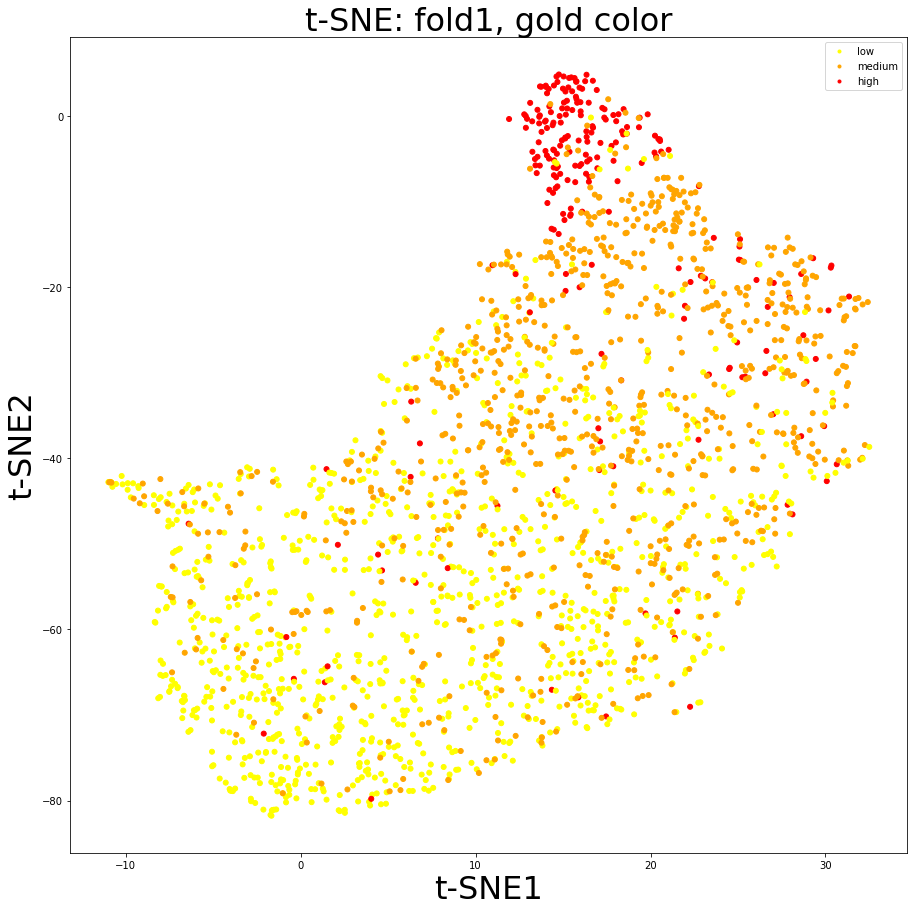

In [38]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
from matplotlib.cbook import get_sample_data
import glob

def main():
    #x = np.linspace(0, 10, 20)
    #ax1.scatter(X_UMAP[2196+2789:,0], X_UMAP[2196+2789:,1], c=g_class_clr[2196+2789:], marker='.')
    x = X_TSNE[0:2196,0]
    y = X_TSNE[0:2196,1]
    c = diff_class_clr[0:2196]
    
    paths = total_img_name[0:2196]#glob.glob('3rd_part_validation/*.tif')
    
    '''fig, ax = plt.subplots(figsize=(15,15))
    ax.set_title('t-SNE: fold1 tiles',fontsize=32)
    ax.set_xlabel('t-SNE1',fontsize=32)
    ax.set_ylabel('t-SNE2',fontsize=32)
    
    
    new_x    = x[c!='none']
    new_y    = y[c!='none']
    print(new_x)
    new_path = np.array(paths)[(c!='none')] 
    print(new_path)
    print(new_y[0])
    imscatter(new_x[0], new_y[0], new_path[0], zoom=0.1, ax=ax)
    '''
    
    fig, ax = plt.subplots(figsize=(15,15))
    ax.set_title('t-SNE: fold1 tiles',fontsize=32)
    ax.set_xlabel('t-SNE1',fontsize=32)
    ax.set_ylabel('t-SNE2',fontsize=32)
    imscatter(x, y, paths, zoom=0.1, ax=ax)
    
    ##############################################
    fig, ax = plt.subplots(figsize=(15,15))
    ax.scatter(X_TSNE[0:2196,0], X_TSNE[0:2196,1], s=100,c=g_class_clr[0:2196], marker='.')
    ax.set_title('t-SNE: fold1, gold color',fontsize=32)
    ax.set_xlabel('t-SNE1',fontsize=32)
    ax.set_ylabel('t-SNE2',fontsize=32)
    ax.legend(markers,['low','medium','high'], numpoints=1)

    plt.show()

def imscatter(x, y, paths, ax=None, zoom=.1):
    if ax is None:
        ax = plt.gca()
    x, y = np.atleast_1d(x, y)
    artists = []
    for x0, y0,p in zip(x, y,paths):
        im = OffsetImage(cv2.imread('1st_part_validation/'+p), zoom=zoom)
        ab = AnnotationBbox(im, (x0, y0), xycoords='data', frameon=False)
        artists.append(ax.add_artist(ab))
    ax.update_datalim(np.column_stack([x, y]))
    ax.autoscale()
    return artists

main()

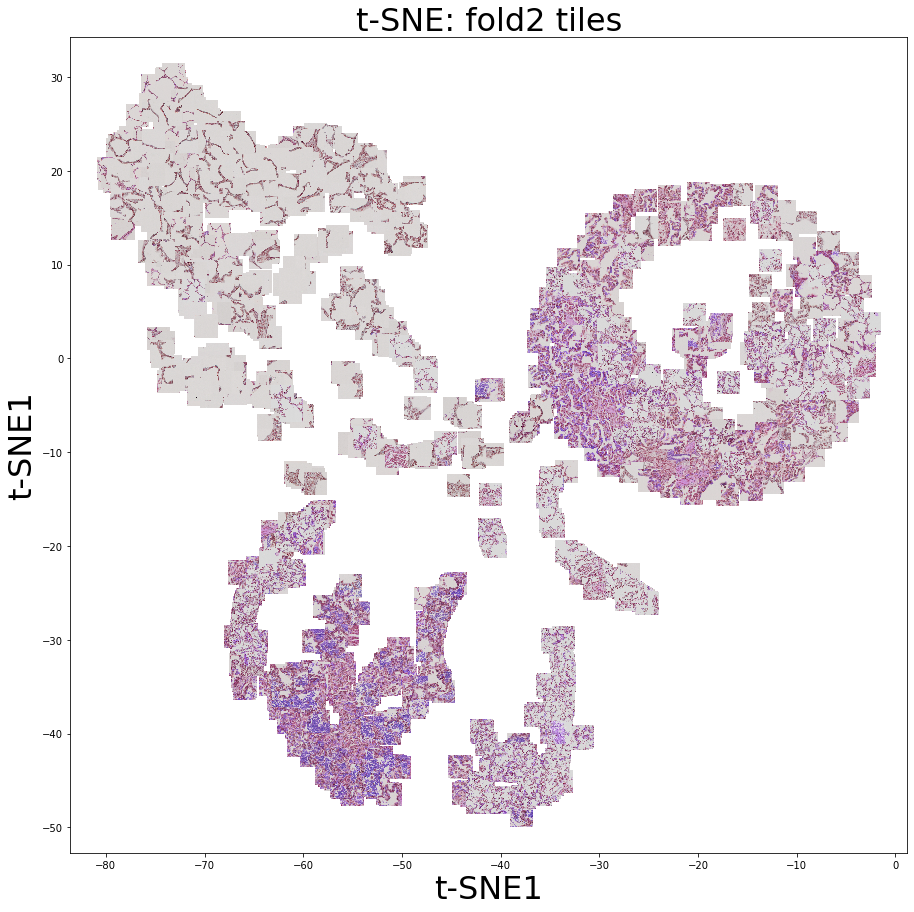

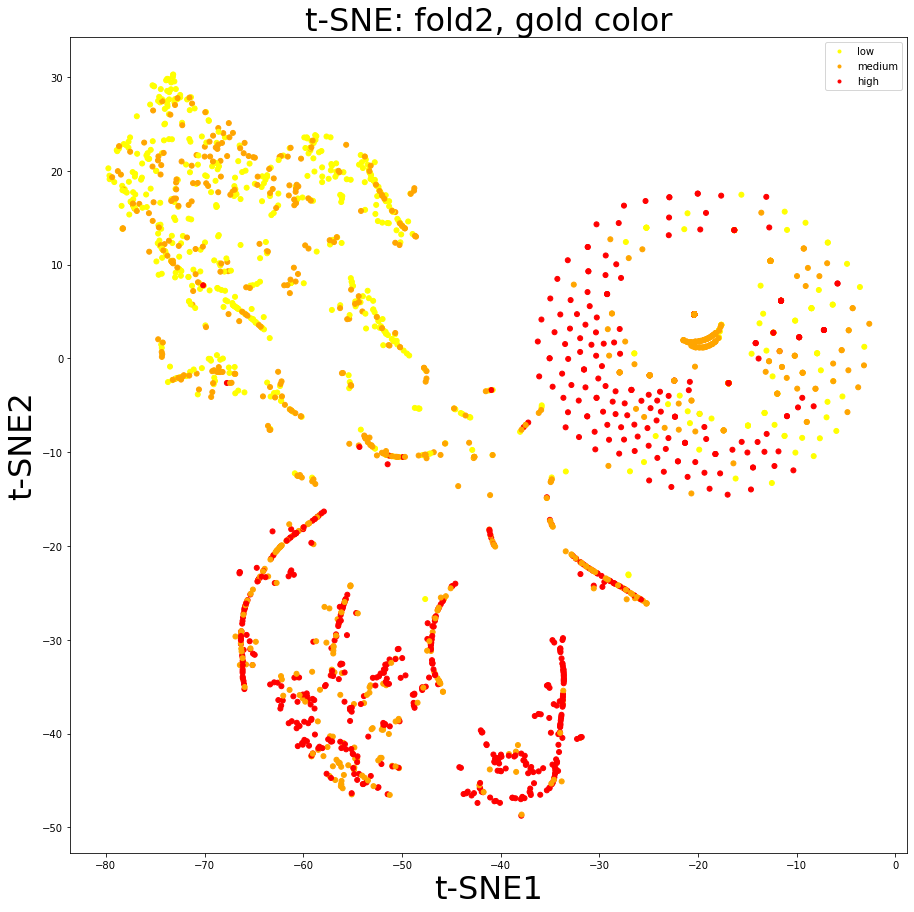

In [39]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
from matplotlib.cbook import get_sample_data
import glob
markers = [plt.Line2D([0,0],[0,0],color=color, marker='.', linestyle='') for color in class_color_map.values()]
def main():
    #x = np.linspace(0, 10, 20)
    #ax1.scatter(X_UMAP[2196+2789:,0], X_UMAP[2196+2789:,1], c=g_class_clr[2196+2789:], marker='.')
    x = X_TSNE[2196:2196+2789,0]
    y = X_TSNE[2196:2196+2789,1]
    c = diff_class_clr[2196:2196+2789]
    
    paths = total_img_name[2196:2196+2789]#glob.glob('3rd_part_validation/*.tif')
    '''
    fig, ax = plt.subplots(figsize=(15,15))
    ax.set_title('TSNE: fold2 tiles')
    
    
    
    new_x    = x[c!='none']
    new_y    = y[c!='none']
  
    new_path = np.array(paths)[(c!='none')] 
    imscatter(new_x[0], new_y[0], new_path[0], zoom=0.1, ax=ax)
    
    
    paths = total_img_name[2196:2196+2789]#glob.glob('3rd_part_validation/*.tif')
    '''
    
    fig, ax = plt.subplots(figsize=(15,15))
    ax.set_title('t-SNE: fold2 tiles',fontsize=32)
    ax.set_xlabel('t-SNE1',fontsize=32)
    ax.set_ylabel('t-SNE1',fontsize=32)
    imscatter(x, y, paths, zoom=0.1, ax=ax)
    fig, ax = plt.subplots(figsize=(15,15))
    ax.scatter(X_TSNE[2196:2196+2789,0], X_TSNE[2196:2196+2789,1], s=100,c=g_class_clr[2196:2196+2789], marker='.')
    ax.set_title('t-SNE: fold2, gold color',fontsize=32)
    ax.set_xlabel('t-SNE1',fontsize=32)
    ax.set_ylabel('t-SNE2',fontsize=32)
    ax.legend(markers,['low','medium','high'], numpoints=1)

    plt.show()

def imscatter(x, y, paths, ax=None, zoom=.1):
    if ax is None:
        ax = plt.gca()
    x, y = np.atleast_1d(x, y)
    artists = []
    for x0, y0,p in zip(x, y,paths):
        im = OffsetImage(cv2.imread('2nd_part_validation/'+p), zoom=zoom)
        ab = AnnotationBbox(im, (x0, y0), xycoords='data', frameon=False)
        artists.append(ax.add_artist(ab))
    ax.update_datalim(np.column_stack([x, y]))
    ax.autoscale()
    return artists

main()

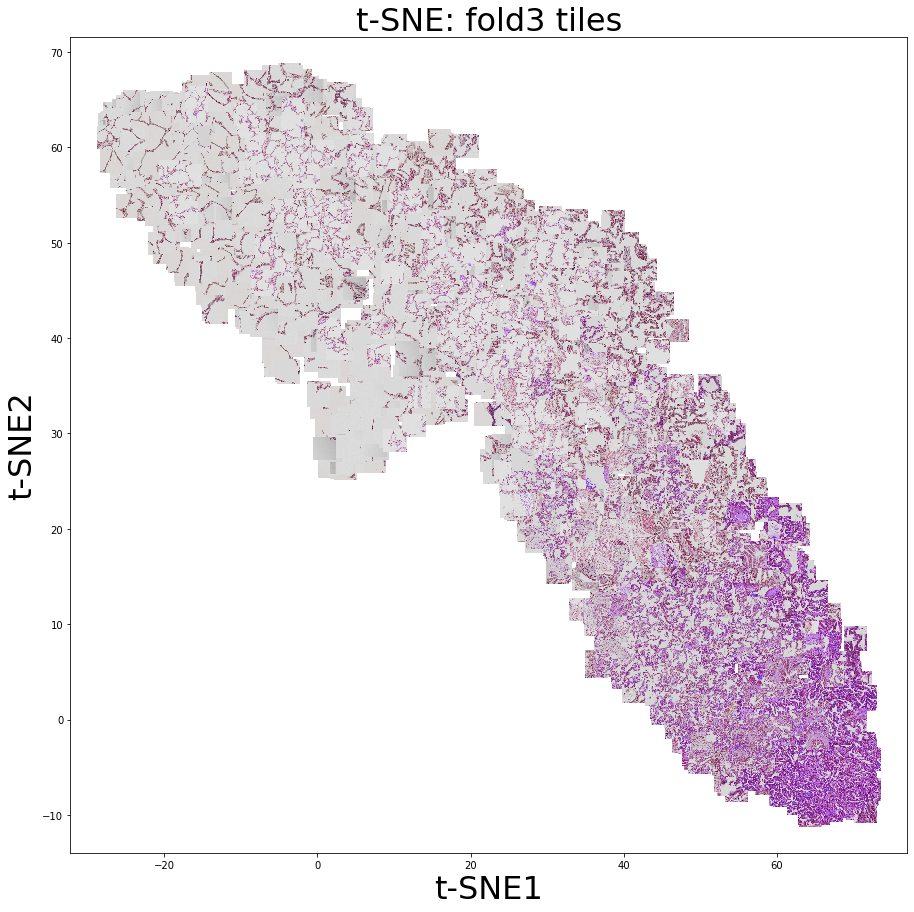

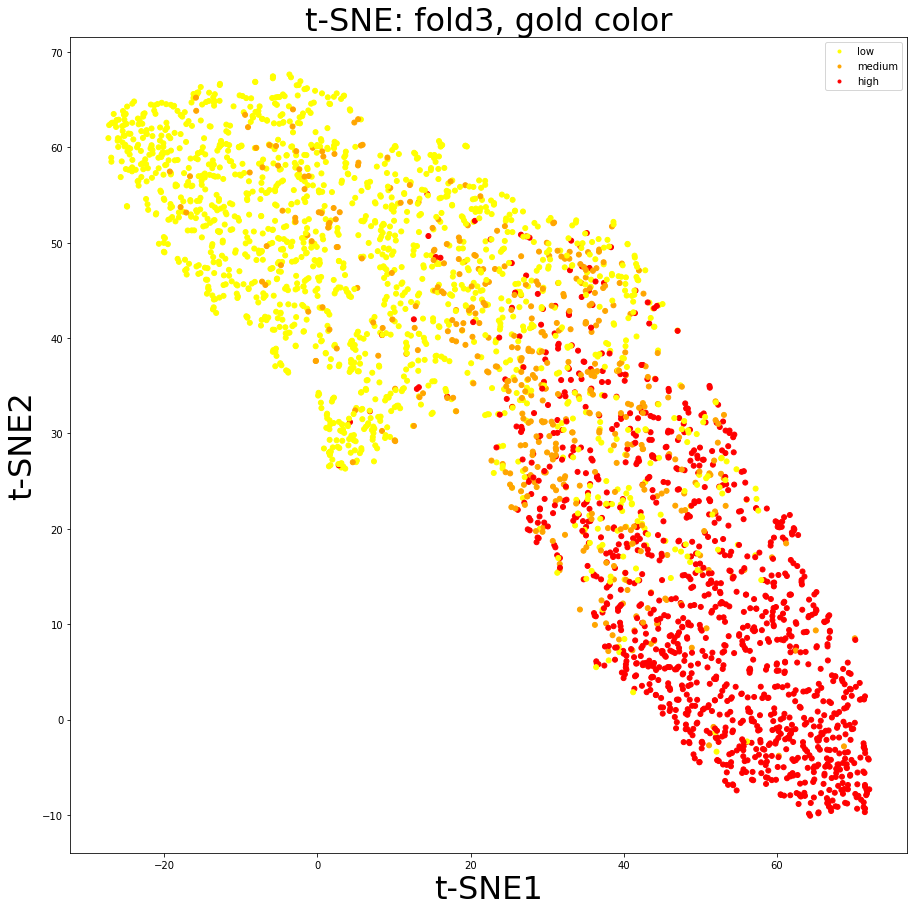

In [40]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
from matplotlib.cbook import get_sample_data
import glob

def main():
    #x = np.linspace(0, 10, 20)
    #ax1.scatter(X_UMAP[2196+2789:,0], X_UMAP[2196+2789:,1], c=g_class_clr[2196+2789:], marker='.')
    x = X_TSNE[2196+2789:,0]
    y = X_TSNE[2196+2789:,1]
    
    
    c = diff_class_clr[2196+2789:]
    
    paths = total_img_name[2196+2789:]#glob.glob('3rd_part_validation/*.tif')
    '''
    fig, ax = plt.subplots(figsize=(15,15))
    ax.set_title('UMAP: fold3 tiles')
    
    
    
    new_x    = x[c!='none']
    new_y    = y[c!='none']
  
    new_path = np.array(paths)[(c!='none')] 
    imscatter(new_x[0], new_y[0], new_path[0], zoom=0.1, ax=ax)
    '''
    paths = total_img_name[2196+2789:]#glob.glob('3rd_part_validation/*.tif')
    fig, ax = plt.subplots(figsize=(15,15))
    ax.set_title('t-SNE: fold3 tiles',fontsize=32)
    ax.set_xlabel('t-SNE1',fontsize=32)
    ax.set_ylabel('t-SNE2',fontsize=32)
    imscatter(x, y, paths, zoom=0.1, ax=ax)
    
    
    fig, ax = plt.subplots(figsize=(15,15))
    ax.scatter(X_TSNE[2196+2789:,0], X_TSNE[2196+2789:,1], s=100,c=g_class_clr[2196+2789:], marker='.')
    ax.set_title('t-SNE: fold3, gold color',fontsize=32)
    ax.set_xlabel('t-SNE1',fontsize=32)
    ax.set_ylabel('t-SNE2',fontsize=32)
    ax.legend(markers,['low','medium','high'], numpoints=1)

    plt.show()

def imscatter(x, y, paths, ax=None, zoom=.1):
    if ax is None:
        ax = plt.gca()
    #try:
     #   image = cv2.imread(image_path)
    #except TypeError:
        # Likely already an array...
     #   pass
    #im = OffsetImage(image, zoom=zoom)
    x, y = np.atleast_1d(x, y)
    artists = []
    for x0, y0,p in zip(x, y,paths):
        im = OffsetImage(cv2.imread('3rd_part_validation/'+p), zoom=zoom)
        ab = AnnotationBbox(im, (x0, y0), xycoords='data', frameon=False)
        artists.append(ax.add_artist(ab))
    ax.update_datalim(np.column_stack([x, y]))
    ax.autoscale()
    return artists

main()